## Importing Libraries

In [2]:
# Core Python Libraries
import os
import random
import shutil
import uuid
from tqdm import tqdm

# Numerical & Data Handling
import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.image as mpimg
import matplotlib.patches as patches

# OpenCV for image handling
import cv2

# TensorFlow & Keras
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras.models import load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.applications.efficientnet import preprocess_input

# Sklearn for Evaluation
from sklearn.metrics import classification_report, confusion_matrix

# Albumentations for image augmentation
import albumentations as A

# Colab Integration
from google.colab import drive

# Print Environment Info
print("✅ TensorFlow version:", tf.__version__)
print("✅ TensorFlow Hub version:", hub.__version__)
print("GPU", "available (YES!!!)" if tf.config.list_physical_devices("GPU") else "not available:(")

✅ TensorFlow version: 2.18.0
✅ TensorFlow Hub version: 0.16.1
GPU available (YES!!!)


In [3]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [4]:
folder_path = '/content/drive/My Drive/Recycling_waste/recycling waste'

files = os.listdir(folder_path)
print(files)

['paper', 'clothes', 'batteries', 'glass', 'plastic', 'organic', 'light blubs', 'e-waste', 'metal']


## Class Distribution

In [6]:

def count_images_per_class(folder_path):
    image_extensions = ('.png', '.jpg', '.jpeg', '.bmp', '.gif')
    total_images = 0
    class_counts = {}

    print("📊 Image count per class:\n")

    for class_name in sorted(os.listdir(folder_path)):
        class_path = os.path.join(folder_path, class_name)

        if os.path.isdir(class_path):
            image_files = [f for f in os.listdir(class_path)
                           if os.path.isfile(os.path.join(class_path, f)) and f.lower().endswith(image_extensions)]
            count = len(image_files)
            class_counts[class_name] = count
            print(f"{class_name}: {count} images")
            total_images += count

    print(f"\n✅ Total images across all classes: {total_images}")

    return class_counts, total_images

# Usage
folder_path = '/content/drive/My Drive/Recycling_waste/recycling waste'
class_counts, total_images = count_images_per_class(folder_path)



📊 Image count per class:

batteries: 1122 images
clothes: 729 images
e-waste: 624 images
glass: 773 images
light blubs: 651 images
metal: 1092 images
organic: 671 images
paper: 1468 images
plastic: 1241 images

✅ Total images across all classes: 8371


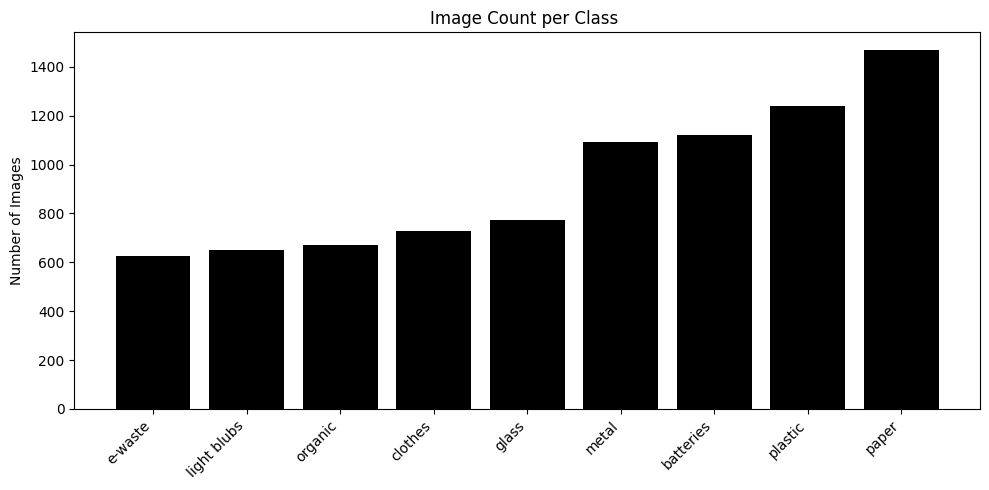

In [12]:
# Sort the dictionary by values (counts)
sorted_counts = dict(sorted(class_counts.items(), key=lambda item: item[1]))

# Plot
plt.figure(figsize=(10, 5))
plt.bar(sorted_counts.keys(), sorted_counts.values(), color='black')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Number of Images')
plt.title('Image Count per Class ')
plt.tight_layout()
plt.show()


## 10 Random Images From Our Dataset

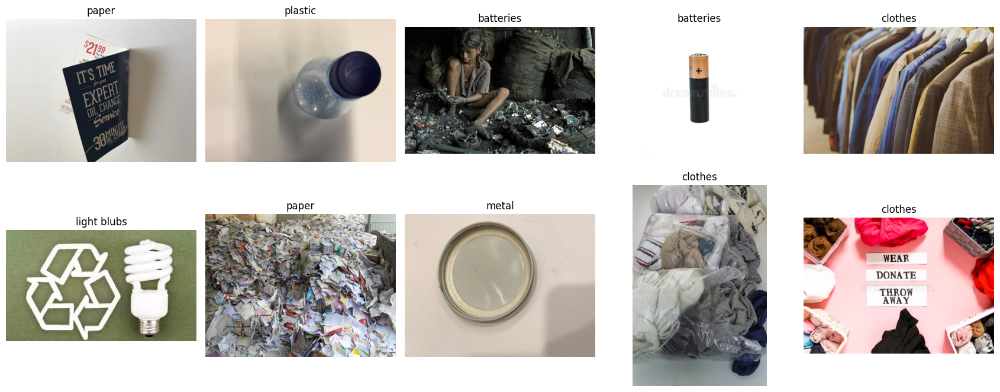

In [ ]:
folder_path = '/content/drive/My Drive/Recycling_waste/recycling waste'

# Get all image file paths from all subfolders
image_paths = []
for root, dirs, files in os.walk(folder_path):
    for file in files:
        if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
            image_paths.append(os.path.join(root, file))

# Pick 5 random images
random_images = random.sample(image_paths, 10)

# Display them
plt.figure(figsize=(17, 7))
for i, img_path in enumerate(random_images):
    img = mpimg.imread(img_path)
    plt.subplot(2, 5, i + 1)  #2 rows 5 columns
    plt.imshow(img)
    plt.axis('off')
    plt.title(os.path.basename(os.path.dirname(img_path)))  # Category name
plt.tight_layout()
plt.show()


## Resize Image size to 224 x 224 which is the ideal size for our model

In [ ]:
input_dir = '/content/drive/My Drive/Recycling_waste/recycling waste'
output_dir = '/content/drive/My Drive/Recycling_waste/recycling_resized'
os.makedirs(output_dir, exist_ok=True)

image_size = (224, 224)

for class_name in os.listdir(input_dir):
    class_input_path = os.path.join(input_dir, class_name)
    class_output_path = os.path.join(output_dir, class_name)

    # Skip the class folder if it already exists with images inside
    if os.path.exists(class_output_path):
        input_images = os.listdir(class_input_path)
        output_images = os.listdir(class_output_path)
        # If all images are already processed, skip
        if set(input_images).issubset(set(output_images)):
            print(f"Skipping {class_name}, already processed.")
            continue
    else:
        os.makedirs(class_output_path, exist_ok=True)

    for img_name in os.listdir(class_input_path):
        img_input_path = os.path.join(class_input_path, img_name)
        img_output_path = os.path.join(class_output_path, img_name)

        # Skip image if it already exists
        if os.path.exists(img_output_path):
            continue

        img = load_img(img_input_path)
        img = img.resize(image_size)
        img.save(img_output_path)

    print(f"Processed and saved images for class '{class_name}'.")

print("All images resized and saved (or skipped if already done).")


Skipping paper, already processed.
Skipping clothes, already processed.
Skipping batteries, already processed.
Skipping glass, already processed.
Skipping plastic, already processed.
Skipping organic, already processed.
Skipping light blubs, already processed.
Skipping e-waste, already processed.
Skipping metal, already processed.
All images resized and saved (or skipped if already done).


## 10 Images from resized folder

Found 8369 images belonging to 9 classes.


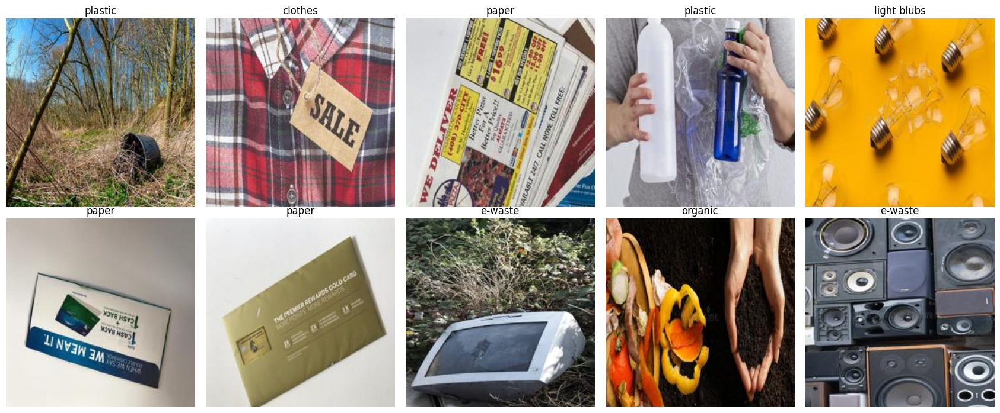

In [ ]:
# New folder with resized images
resized_data_dir = '/content/drive/My Drive/Recycling_waste/recycling_resized'

datagen = ImageDataGenerator(
    preprocessing_function=None  # Images are already resized, no need to preprocess again for viewing
)

all_data = datagen.flow_from_directory(
    resized_data_dir,
    target_size=image_size,  # This will be quick since images are already 224x224
    batch_size=32,
    class_mode='categorical',
    shuffle=True
)

# Get one batch
images_batch, labels_batch = next(all_data)

# Label map
label_map = {v: k for k, v in all_data.class_indices.items()}

# Pick 5 random images
random_indices = random.sample(range(len(images_batch)), 10)

plt.figure(figsize=(17, 7))
for i, idx in enumerate(random_indices):
    img = images_batch[idx]
    label = label_map[np.argmax(labels_batch[idx])]

    plt.subplot(2, 5, i + 1)   #2 rows 5 columns
    plt.imshow(img.astype('uint8'))
    plt.title(label)
    plt.axis('off')
plt.tight_layout()
plt.show()


## Data Augmentation

In [ ]:
input_dir = '/content/drive/My Drive/TACO/TACO/recycling_resized'
output_dir = '/content/drive/My Drive/TACO/TACO/recycling_augmented'
os.makedirs(output_dir, exist_ok=True)

# Augment only classes with fewer than this many images
min_target_images = 1000
image_size = (224, 224)

# Augmentation setup
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

for class_name in os.listdir(input_dir):
    class_input_path = os.path.join(input_dir, class_name)
    class_output_path = os.path.join(output_dir, class_name)
    os.makedirs(class_output_path, exist_ok=True)

    # Get list of images in the class folder
    image_list = os.listdir(class_input_path)
    num_images = len(image_list)

    # Copy original images to the output folder
    for img_name in image_list:
        img_path = os.path.join(class_input_path, img_name)
        os.system(f'cp "{img_path}" "{class_output_path}/"')  # or shutil.copy

    # Only augment if below target count
    if num_images < min_target_images:
        images_to_generate = min_target_images - num_images
        augment_per_image = max(1, images_to_generate // num_images)

        for img_name in image_list:
            img_path = os.path.join(class_input_path, img_name)
            try:
                img = load_img(img_path, target_size=image_size)
                x = img_to_array(img)
                x = x.reshape((1,) + x.shape)

                i = 0
                for batch in datagen.flow(x, batch_size=1):
                    aug_img = array_to_img(batch[0])
                    aug_img.save(os.path.join(class_output_path, f"{img_name[:-4]}_aug{i}.jpg"))
                    i += 1
                    if i >= augment_per_image:
                        break
            except Exception as e:
                print(f"Error processing {img_name}: {e}")

print("Selective augmentation complete.")


Selective augmentation complete.


## Augmented Data Distribution

In [ ]:

def count_images_per_class(folder_path):
    image_extensions = ('.png', '.jpg', '.jpeg', '.bmp', '.gif')
    total_images = 0
    class_counts = {}

    print("📊 Image count per class:\n")

    for class_name in sorted(os.listdir(folder_path)):
        class_path = os.path.join(folder_path, class_name)

        if os.path.isdir(class_path):
            image_files = [f for f in os.listdir(class_path)
                           if os.path.isfile(os.path.join(class_path, f)) and f.lower().endswith(image_extensions)]
            count = len(image_files)
            class_counts[class_name] = count
            print(f"{class_name}: {count} images")
            total_images += count

    print(f"\n✅ Total images across all classes: {total_images}")

    return class_counts, total_images

# Usage
folder_path =  '/content/drive/My Drive/Recycling_waste/recycling_augmented'
class_counts, total_images = count_images_per_class(folder_path)



📊 Image count per class:

batteries: 1122 images
clothes: 1458 images
e-waste: 1248 images
glass: 1544 images
light blubs: 1302 images
metal: 1092 images
organic: 1342 images
paper: 1468 images
plastic: 1241 images

✅ Total images across all classes: 11817


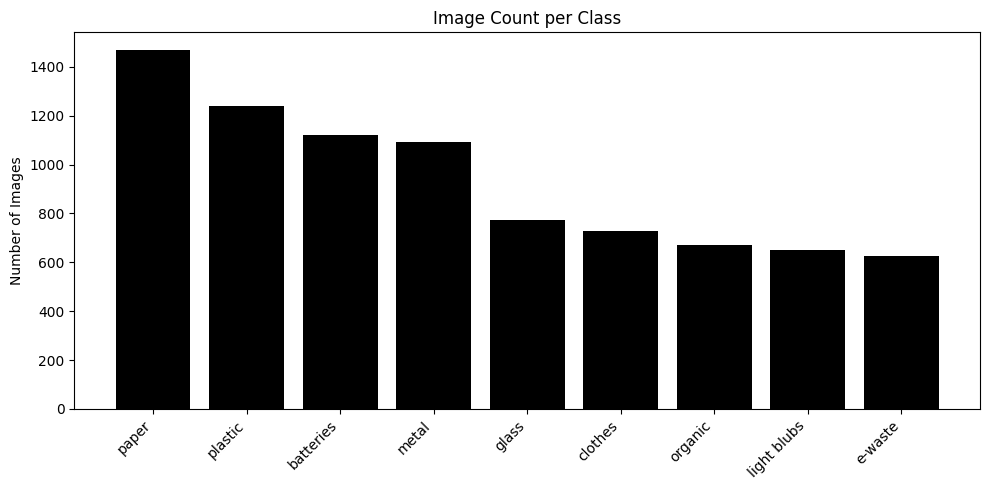

In [39]:

# Sort the dictionary by values (counts) descending order
sorted_counts = dict(sorted(class_counts.items(), key=lambda item: item[1], reverse=True))

# Plot
plt.figure(figsize=(10, 5))
plt.bar(sorted_counts.keys(), sorted_counts.values(), color='black')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Number of Images')
plt.title('Image Count per Class')
plt.tight_layout()
plt.show()


Creating a subset

In [ ]:

# Paths
source_folder =  '/content/drive/My Drive/Recycling_waste/recycling_augmented'
subset_folder =  '/content/drive/My Drive/Recycling_waste/recycling_subset_3'

os.makedirs(subset_folder, exist_ok=True)

# Parameters
total_images_desired = 11817

# Get class names
classes = [d for d in os.listdir(source_folder) if os.path.isdir(os.path.join(source_folder, d))]

# Calculate how many images per class (approximate, equal split)
images_per_class = total_images_desired // len(classes)

print(f"Sampling ~{images_per_class} images per class for a total of ~{images_per_class * len(classes)} images.")

for cls in classes:
    class_source = os.path.join(source_folder, cls)
    class_target = os.path.join(subset_folder, cls)
    os.makedirs(class_target, exist_ok=True)

    all_images = [f for f in os.listdir(class_source) if os.path.isfile(os.path.join(class_source, f))]
    sample_size = min(images_per_class, len(all_images))
    sampled_images = random.sample(all_images, sample_size)

    for img in sampled_images:
        shutil.copy2(os.path.join(class_source, img), os.path.join(class_target, img))

print("Subset created successfully!")


Sampling ~1313 images per class for a total of ~11817 images.
Subset created successfully!


## Dataset Spliiting Into Train, Test, and Validation

In [ ]:
# Paths
subset_folder =  '/content/drive/My Drive/Recycling_waste/recycling_subset_3'
train_folder = '/content/drive/My Drive/Recycling_waste/recycling_train_3'
val_folder =  '/content/drive/My Drive/Recycling_waste/recycling_val_3'
test_folder =  '/content/drive/My Drive/Recycling_waste/recycling_test_3'

# Create output dirs
for folder in [train_folder, val_folder, test_folder]:
    os.makedirs(folder, exist_ok=True)

# Split ratios
train_ratio = 0.8
val_ratio = 0.1
test_ratio = 0.1

# Get class names
classes = [d for d in os.listdir(subset_folder) if os.path.isdir(os.path.join(subset_folder, d))]

for cls in classes:
    class_source = os.path.join(subset_folder, cls)
    class_train = os.path.join(train_folder, cls)
    class_val = os.path.join(val_folder, cls)
    class_test = os.path.join(test_folder, cls)

    os.makedirs(class_train, exist_ok=True)
    os.makedirs(class_val, exist_ok=True)
    os.makedirs(class_test, exist_ok=True)

    images = [f for f in os.listdir(class_source) if os.path.isfile(os.path.join(class_source, f))]
    random.shuffle(images)

    n_total = len(images)
    n_train = int(n_total * train_ratio)
    n_val = int(n_total * val_ratio)

    train_images = images[:n_train]
    val_images = images[n_train:n_train + n_val]
    test_images = images[n_train + n_val:]

    # Copy files
    for img in train_images:
        shutil.copy2(os.path.join(class_source, img), os.path.join(class_train, img))

    for img in val_images:
        shutil.copy2(os.path.join(class_source, img), os.path.join(class_val, img))

    for img in test_images:
        shutil.copy2(os.path.join(class_source, img), os.path.join(class_test, img))

print("Dataset successfully split into train, val, and test folders!")


Dataset successfully split into train, val, and test folders!


In [ ]:
train_dir = '/content/drive/My Drive/Recycling_waste/recycling_train_3'
val_dir = '/content/drive/My Drive/Recycling_waste/recycling_val_3'

def count_images(directory):
    total = 0
    for subfolder in os.listdir(directory):
        sub_path = os.path.join(directory, subfolder)
        if os.path.isdir(sub_path):
            total += len([f for f in os.listdir(sub_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])
    return total

print("Actual train images:", count_images(train_dir))
print("Actual val images:", count_images(val_dir))


Actual train images: 9000
Actual val images: 1123


Flip augmentation

In [ ]:

train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    horizontal_flip=True,   # Flip images horizontally
    vertical_flip=True      # Flip images vertically
)

val_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

train_generator = train_datagen.flow_from_directory(
    '/content/drive/My Drive/Recycling_waste/recycling_train_3',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=True
)

val_generator = val_datagen.flow_from_directory(
    '/content/drive/My Drive/Recycling_waste/recycling_val_3',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)



Found 9000 images belonging to 9 classes.
Found 1123 images belonging to 9 classes.


## confirming if MobileNetV2 preprocessing was applied

In [ ]:
# Load one batch from your training data
x_batch, y_batch = next(train_generator)

# Print pixel value range
print("✅ Shape of image batch:", x_batch.shape)
print("✅ Min pixel value:", x_batch.min())
print("✅ Max pixel value:", x_batch.max())

# Check if MobileNetV2 preprocessing is applied correctly
if x_batch.min() >= -1.0 and x_batch.max() <= 1.0:
    print("\n✅ MobileNetV2 preprocessing is being applied correctly!")
else:
    print("\n❌ WARNING: MobileNetV2 preprocessing is NOT applied — please use preprocess_input.")


✅ Shape of image batch: (32, 224, 224, 3)
✅ Min pixel value: -1.0
✅ Max pixel value: 1.0

✅ MobileNetV2 preprocessing is being applied correctly!


## Double check labels

In [ ]:

# Reverse the class_indices dictionary to map index → label name
index_to_label = {v: k for k, v in train_generator.class_indices.items()}

# Get total number of images
num_samples = len(train_generator.filenames)

# Pick 5 random indices
random_indices = random.sample(range(num_samples), 5)

# Print random filenames and their corresponding class names
for i in random_indices:
    filename = train_generator.filenames[i]
    label_index = train_generator.classes[i]
    label_name = index_to_label[label_index]
    print(f"File: {filename}, Label: {label_name}")


File: metal/eco-friendly-reusable-metal-drinking-straw-zero-waste-concept-eco-friendly-reusable-metal-drinking-straw-zero-waste-concept-165678297.jpg, Label: metal
File: e-waste/scrap-metal-and-iron-xxxl-picture-id173691837_aug0.jpg, Label: e-waste
File: paper/paper568.jpg, Label: paper
File: light blubs/images93.jpg, Label: light blubs
File: e-waste/wastepaper-picture-id182148255.jpg, Label: e-waste


### Let’s visualize a few images from your training batch along with their labels, so you can double-check everything looks good

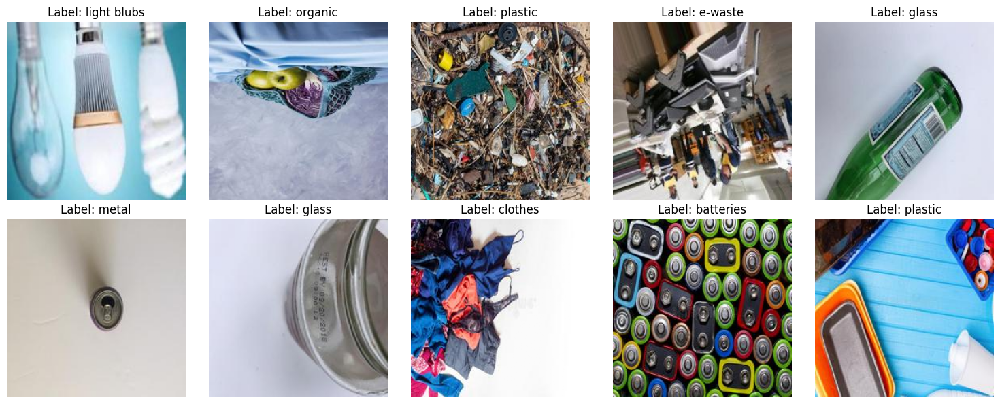

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

class_indices = train_generator.class_indices
index_to_class = {v: k for k, v in class_indices.items()}

# Fetch one batch
images, labels = next(train_generator)

# Plot 10 images in 2 rows and 5 columns
fig, axes = plt.subplots(2, 5, figsize=(15, 6))  # 2 rows, 5 columns

for i in range(10):
    row = i // 5
    col = i % 5
    img = images[i]
    label = labels[i]
    class_id = np.argmax(label)
    class_name = index_to_class[class_id]

    axes[row, col].imshow((img + 1) / 2)  # Unnormalize if needed
    axes[row, col].set_title(f"Label: {class_name}")
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()


MobileNetV2 Archictecture for your 9-class classification:

In [ ]:
num_classes = 9

# Load MobileNetV2 base model without top layers
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add global average pooling layer
x = GlobalAveragePooling2D()(base_model.output)

# Add final dense layer with softmax for classification
output = Dense(num_classes, activation='softmax')(x)

# Create final model
model = Model(inputs=base_model.input, outputs=output)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.summary()


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,269,513 (8.66 MB)

 Trainable params: 2,235,401 (8.53 MB)

 Non-trainable params: 34,112 (133.25 KB)

### FIRST MOBILE TRAINING


In [ ]:
# 2. Paths to training and validation data
train_dir = '/content/drive/My Drive/Recycling_waste/recycling_train_2'
val_dir = '/content/drive/My Drive/Recycling_waste/recycling_val_2'

# 3. Data generators
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    horizontal_flip=True,
    vertical_flip=True
)

val_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=True
)

val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

# 4. Check preprocessing on one batch (optional but recommended)
x_batch, y_batch = next(train_generator)
print("✅ Shape of image batch:", x_batch.shape)
print("✅ Min pixel value:", x_batch.min())
print("✅ Max pixel value:", x_batch.max())
if x_batch.min() >= -1.0 and x_batch.max() <= 1.0:
    print("✅ MobileNetV2 preprocessing is applied correctly!")
else:
    print("❌ MobileNetV2 preprocessing might NOT be applied correctly!")

# 5. Compute class weights for imbalance
labels = train_generator.classes
class_weights_array = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(labels),
    y=labels
)
class_weights = {i: float(w) for i, w in enumerate(class_weights_array)}
print("Class weights:", class_weights)

# 6. Build model
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
x = base_model.output
x = GlobalAveragePooling2D()(x)
predictions = Dense(9, activation='softmax')(x)  # Change 9 if you have different number of classes
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze base model layers
for layer in base_model.layers:
    layer.trainable = False

# 7. Compile model
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# 8. Setup early stopping
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=3,
    restore_best_weights=True,
    verbose=1
)

# 9. Train model
history = model.fit(
    train_generator,
    epochs=50,
    validation_data=val_generator,
    class_weight=class_weights,
    callbacks=[early_stop]
)

# 10. Save the trained model
model.save('/content/drive/My Drive/Recycling_waste/recycle_model_2.h5')
print("✅ Training complete and model saved!")


Mounted at /content/drive
Found 2878 images belonging to 9 classes.
Found 360 images belonging to 9 classes.
✅ Shape of image batch: (32, 224, 224, 3)
✅ Min pixel value: -1.0
✅ Max pixel value: 1.0
✅ MobileNetV2 preprocessing is applied correctly!
Class weights: {0: 0.9993055555555556, 1: 0.9993055555555556, 2: 0.9993055555555556, 3: 1.002438174851968, 4: 1.002438174851968, 5: 0.9993055555555556, 6: 0.9993055555555556, 7: 0.9993055555555556, 8: 0.9993055555555556}
9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 1479s 16s/step - accuracy: 0.3593 - loss: 1.8307 - val_accuracy: 0.6222 - val_loss: 1.0640
Epoch 2/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 65s 171ms/step - accuracy: 0.7157 - loss: 0.8912 - val_accuracy: 0.6611 - val_loss: 0.9041
Epoch 3/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 16s 175ms/step - accuracy: 0.7742 - loss: 0.7132 - val_accuracy: 0.6917 - val_loss: 0.8388
Epoch 4/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - accuracy: 0.8024 - loss: 0.6237 - val_accuracy: 0.6972 - val_loss: 0.8114
Epoch 5/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - accuracy: 0.8171 - loss: 0.5701 - val_accuracy: 0.7222 - val_loss: 0.7805
Epoch 6/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - accuracy: 0.8526 - loss: 0.5117 - val_accuracy: 0.7250 - val_loss: 0.7856
Epoch 7/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - accuracy: 0.8674 - loss: 0.4480 - val_accuracy: 0.7083 - val_loss: 0.7923
Epoch 8/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - accuracy: 0.8645 - loss: 0.4373 - val_accu

✅ Training complete and model saved!


## Model Inspection

In [41]:
model = load_model('/content/drive/My Drive/Recycling_waste/recycle_model_2.h5'

#### Validation

In [42]:
val_dir = '/content/drive/My Drive/Recycling_waste/recycling_val_2'

# Recreate the validation generator
val_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

# Now evaluate
loss, accuracy = model.evaluate(val_generator)
print(f"Test Accuracy: {accuracy:.4f}")


Found 360 images belonging to 9 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.



12/12 ━━━━━━━━━━━━━━━━━━━━ 131s 11s/step - accuracy: 0.7530 - loss: 0.6778
Test Accuracy: 0.7389


12/12 ━━━━━━━━━━━━━━━━━━━━ 7s 324ms/step
              precision    recall  f1-score   support

   batteries       0.74      0.78      0.76        40
     clothes       0.85      0.72      0.78        40
     e-waste       0.71      0.75      0.73        40
       glass       0.81      0.75      0.78        40
 light blubs       0.87      0.85      0.86        40
       metal       0.67      0.60      0.63        40
     organic       0.73      0.88      0.80        40
       paper       0.74      0.72      0.73        40
     plastic       0.56      0.60      0.58        40

    accuracy                           0.74       360
   macro avg       0.74      0.74      0.74       360
weighted avg       0.74      0.74      0.74       360



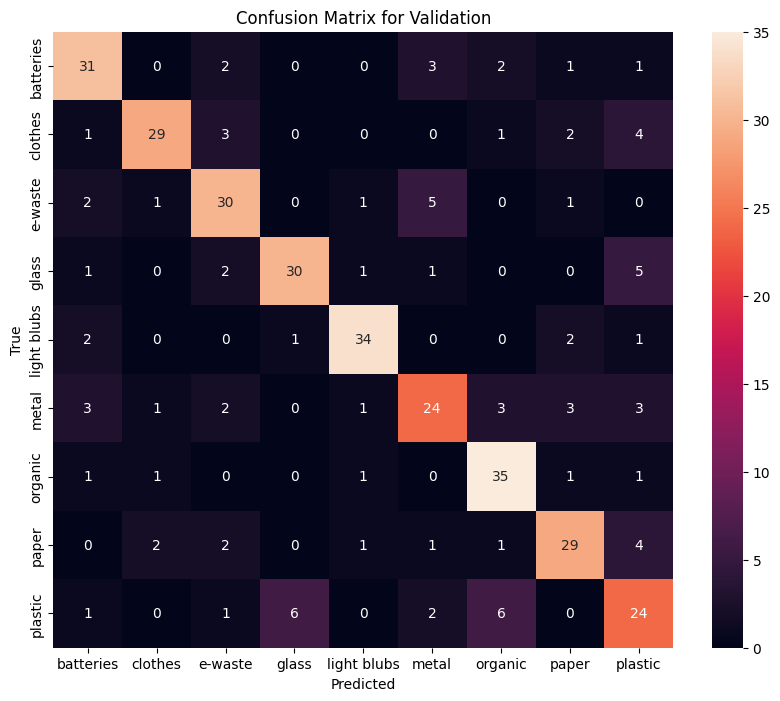

In [43]:
y_pred = model.predict(val_generator)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = val_generator.classes
print(classification_report(y_true, y_pred_classes, target_names=val_generator.class_indices.keys()))


plt.figure(figsize=(10, 8))
cm = confusion_matrix(y_true, y_pred_classes)
sns.heatmap(cm, annot=True, fmt='d', xticklabels=val_generator.class_indices, yticklabels=val_generator.class_indices)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix for Validation")
plt.show()

#### Test

In [45]:
# Load test data generator
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

test_generator = test_datagen.flow_from_directory(
    '/content/drive/My Drive/Recycling_waste/recycling_test_2',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

# Evaluate model
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"✅ Test Accuracy: {test_accuracy:.4f}")
print(f"❌ Test Loss: {test_loss:.4f}")


Found 360 images belonging to 9 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.



12/12 ━━━━━━━━━━━━━━━━━━━━ 92s 8s/step - accuracy: 0.7919 - loss: 0.6262
✅ Test Accuracy: 0.7639
❌ Test Loss: 0.7056


12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step
              precision    recall  f1-score   support

   batteries       0.76      0.80      0.78        40
     clothes       0.79      0.85      0.82        40
     e-waste       0.70      0.82      0.76        40
       glass       0.63      0.78      0.70        40
 light blubs       0.87      0.85      0.86        40
       metal       0.89      0.60      0.72        40
     organic       0.79      0.78      0.78        40
       paper       0.84      0.68      0.75        40
     plastic       0.69      0.72      0.71        40

    accuracy                           0.76       360
   macro avg       0.78      0.76      0.76       360
weighted avg       0.78      0.76      0.76       360



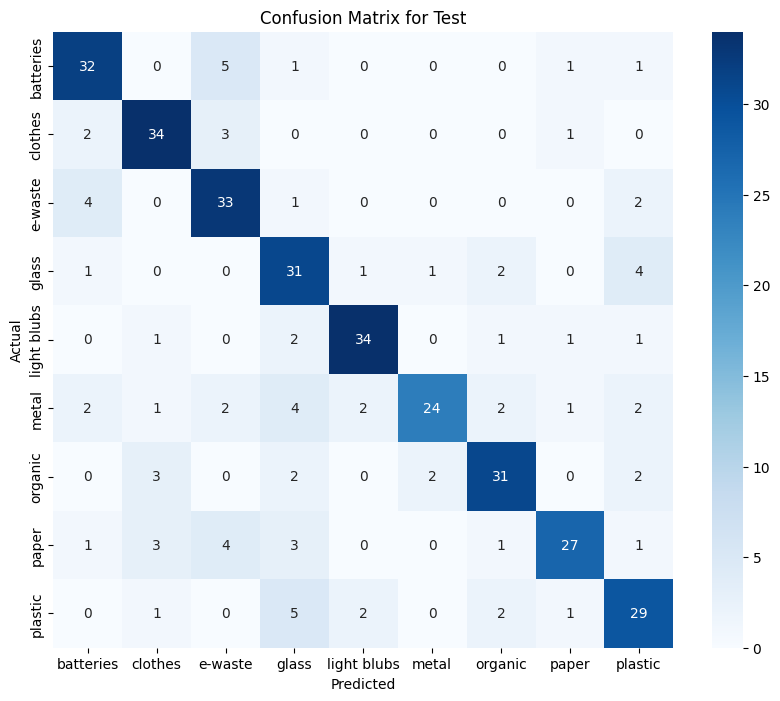

In [46]:

# Get predictions from the model
Y_pred = model.predict(test_generator)
y_pred = np.argmax(Y_pred, axis=1)

# True labels
y_true = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

# Print classification report
print(classification_report(y_true, y_pred, target_names=class_labels))

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt="d", xticklabels=class_labels, yticklabels=class_labels, cmap="Blues")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Test')
plt.show()


### Model Fine-Tunning

In [ ]:
from tensorflow.keras.models import load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# 1. Load the previously trained model
model = load_model('/content/drive/My Drive/Recycling_waste/recycle_model_2.h5')

# 2. Unfreeze the last few layers of the base_model for fine-tuning
# For MobileNetV2, let's unfreeze the last 50 layers as example
for layer in model.layers[-50:]:
    layer.trainable = True

# Optional: freeze the rest (in case you reloaded a model with some layers already unfrozen)
for layer in model.layers[:-50]:
    layer.trainable = False

# 3. Compile with a lower learning rate for fine-tuning
model.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# 4. Setup callbacks (early stopping + LR reduction)
early_stop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1)
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, verbose=1, min_lr=1e-7)

# 5. Assuming train_generator and val_generator are already defined (reuse from before)
history_finetune = model.fit(
    train_generator,
    epochs=20,
    validation_data=val_generator,
    class_weight=class_weights,
    callbacks=[early_stop, lr_scheduler]
)

# 6. Save fine-tuned model
model.save('/content/drive/My Drive/Recycling_waste/recycle_model_finetuned.h5')
print("✅ Fine-tuning complete and model saved!")


Epoch 1/20
90/90 ━━━━━━━━━━━━━━━━━━━━ 49s 309ms/step - accuracy: 0.7880 - loss: 0.6486 - val_accuracy: 0.7528 - val_loss: 0.7040 - learning_rate: 1.0000e-05
Epoch 2/20
90/90 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - accuracy: 0.8235 - loss: 0.5437 - val_accuracy: 0.7556 - val_loss: 0.7007 - learning_rate: 1.0000e-05
Epoch 3/20
90/90 ━━━━━━━━━━━━━━━━━━━━ 16s 176ms/step - accuracy: 0.8496 - loss: 0.4924 - val_accuracy: 0.7417 - val_loss: 0.7012 - learning_rate: 1.0000e-05
Epoch 4/20
90/90 ━━━━━━━━━━━━━━━━━━━━ 15s 162ms/step - accuracy: 0.8659 - loss: 0.4320 - val_accuracy: 0.7528 - val_loss: 0.6968 - learning_rate: 1.0000e-05
Epoch 5/20
90/90 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - accuracy: 0.8869 - loss: 0.4034 - val_accuracy: 0.7556 - val_loss: 0.6957 - learning_rate: 1.0000e-05
Epoch 6/20
90/90 ━━━━━━━━━━━━━━━━━━━━ 15s 167ms/step - accuracy: 0.8968 - loss: 0.3579 - val_accuracy: 0.7556 - val_loss: 0.6916 - learning_rate: 1.0000e-05
Epoch 7/20
90/90 ━━━━━━━━━━━━━━━━━━━━ 15s 169ms/step - acc

✅ Fine-tuning complete and model saved!


## Fine-Tunning Inspection

In [49]:

model = load_model('/content/drive/My Drive/Recycling_waste/recycle_model_2_finetuned.h5')

# Evaluate on the validation set (or test set if you have one)

loss, accuracy = model.evaluate(val_generator)
print(f"Test Accuracy: {accuracy:.4f}")



12/12 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 0.7496 - loss: 0.6661
Test Accuracy: 0.7389


#### Validation

In [51]:
val_dir = '/content/drive/My Drive/Recycling_waste/recycling_val_2'

# Recreate the validation generator
val_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

# Now evaluate
loss, accuracy = model.evaluate(val_generator)
print(f"Test Accuracy: {accuracy:.4f}")

Found 360 images belonging to 9 classes.
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - accuracy: 0.7496 - loss: 0.6661
Test Accuracy: 0.7389


12/12 ━━━━━━━━━━━━━━━━━━━━ 6s 309ms/step
              precision    recall  f1-score   support

   batteries       0.72      0.78      0.75        40
     clothes       0.81      0.72      0.76        40
     e-waste       0.74      0.70      0.72        40
       glass       0.81      0.75      0.78        40
 light blubs       0.87      0.85      0.86        40
       metal       0.66      0.68      0.67        40
     organic       0.74      0.88      0.80        40
       paper       0.78      0.72      0.75        40
     plastic       0.55      0.57      0.56        40

    accuracy                           0.74       360
   macro avg       0.74      0.74      0.74       360
weighted avg       0.74      0.74      0.74       360



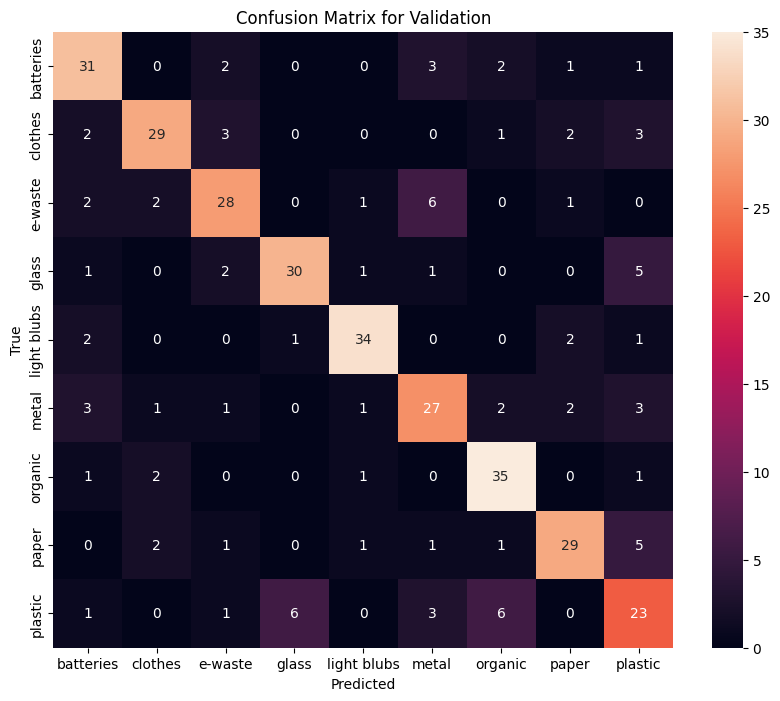

In [52]:
y_pred = model.predict(val_generator)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = val_generator.classes
print(classification_report(y_true, y_pred_classes, target_names=val_generator.class_indices.keys()))


plt.figure(figsize=(10, 8))
cm = confusion_matrix(y_true, y_pred_classes)
sns.heatmap(cm, annot=True, fmt='d', xticklabels=val_generator.class_indices, yticklabels=val_generator.class_indices)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix for Validation")
plt.show()

In [53]:
# Load test data generator
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

test_generator = test_datagen.flow_from_directory(
    '/content/drive/My Drive/Recycling_waste/recycling_test_2',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

# Evaluate model
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"✅ Test Accuracy: {test_accuracy:.4f}")
print(f"❌ Test Loss: {test_loss:.4f}")


Found 360 images belonging to 9 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.



12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - accuracy: 0.8115 - loss: 0.6075
✅ Test Accuracy: 0.7806
❌ Test Loss: 0.6951


12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step


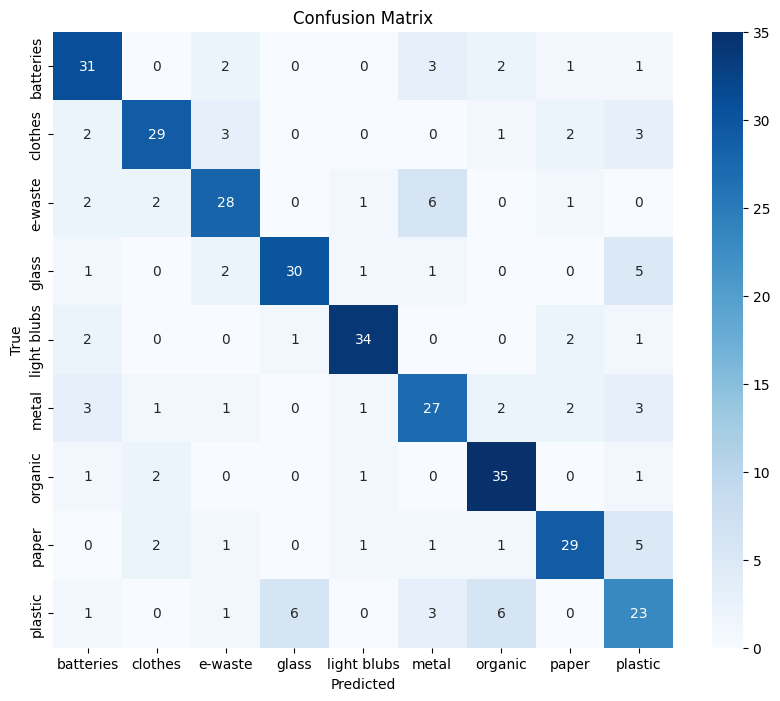

Classification Report:

              precision    recall  f1-score   support

   batteries       0.72      0.78      0.75        40
     clothes       0.81      0.72      0.76        40
     e-waste       0.74      0.70      0.72        40
       glass       0.81      0.75      0.78        40
 light blubs       0.87      0.85      0.86        40
       metal       0.66      0.68      0.67        40
     organic       0.74      0.88      0.80        40
       paper       0.78      0.72      0.75        40
     plastic       0.55      0.57      0.56        40

    accuracy                           0.74       360
   macro avg       0.74      0.74      0.74       360
weighted avg       0.74      0.74      0.74       360



In [54]:
# 1. Predict on validation set
val_generator.reset()  # Reset before predicting
pred_probs = model.predict(val_generator, verbose=1)
y_pred = np.argmax(pred_probs, axis=1)
y_true = val_generator.classes

# 2. Get class labels
class_labels = list(val_generator.class_indices.keys())

# 3. Confusion Matrix
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

# 4. Classification Report
print("Classification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_labels))



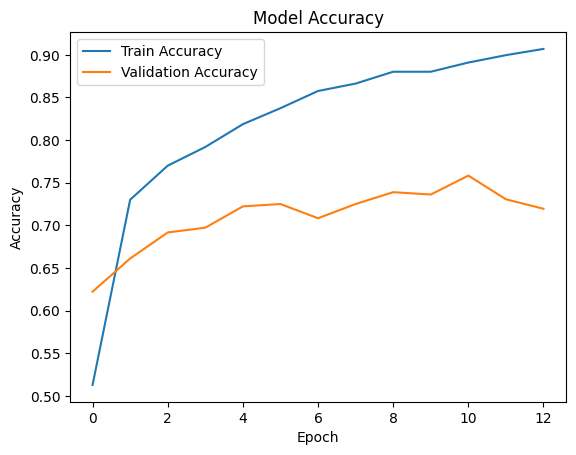

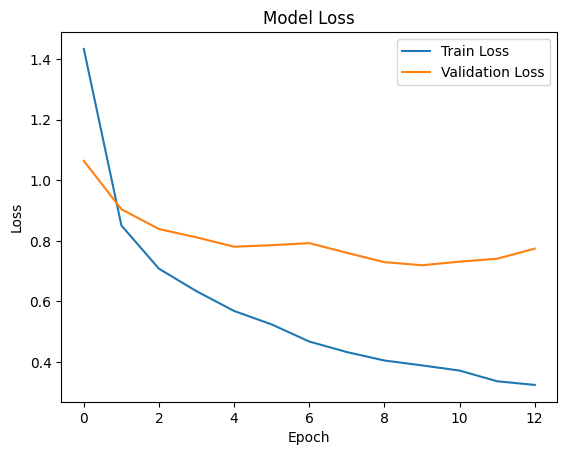

In [ ]:
# Plot accuracy
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot loss
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


## Predicting few Images

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


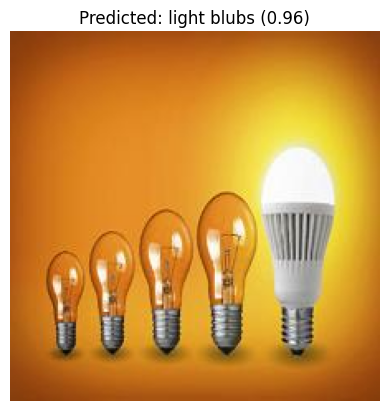

In [ ]:
# Load and preprocess one image manually
img_path = '/content/drive/My Drive/Recycling_waste/sample_data/Bulb/0902ledlighting.jpg'  # Example image
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array_preprocessed = preprocess_input(img_array)
img_array_preprocessed = np.expand_dims(img_array_preprocessed, axis=0)

# Predict
prediction = model.predict(img_array_preprocessed)
predicted_class = np.argmax(prediction)
class_labels = list(test_generator.class_indices.keys())
confidence = np.max(prediction)

# Display image and prediction
plt.imshow(np.array(img).astype('uint8'))  # Convert PIL to NumPy array first
plt.axis('off')
plt.title(f"Predicted: {class_labels[predicted_class]} ({confidence:.2f})")
plt.show()



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


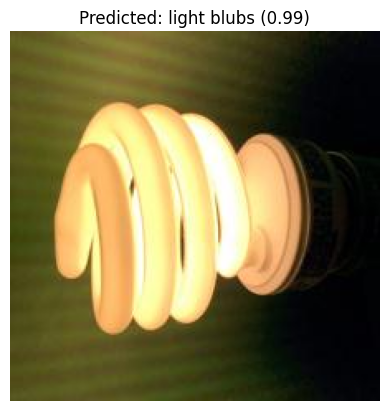

In [ ]:
# Load and preprocess one image manually
img_path = '/content/drive/My Drive/Recycling_waste/sample_data/Bulb/10537723_web1_M-Light-Bulb-EDH-180212.jpg'
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array_preprocessed = preprocess_input(img_array)
img_array_preprocessed = np.expand_dims(img_array_preprocessed, axis=0)

# Predict
prediction = model.predict(img_array_preprocessed)
predicted_class = np.argmax(prediction)
class_labels = list(test_generator.class_indices.keys())
confidence = np.max(prediction)

# Display image and prediction
plt.imshow(np.array(img).astype('uint8'))  # Convert PIL to NumPy array first
plt.axis('off')
plt.title(f"Predicted: {class_labels[predicted_class]} ({confidence:.2f})")
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


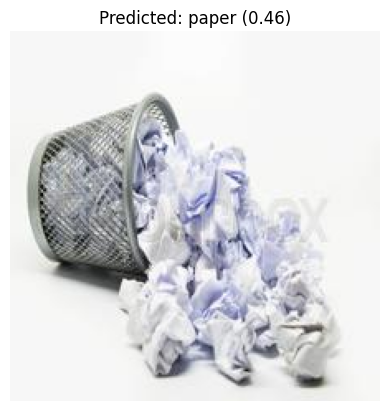

In [ ]:
img_path = '/content/drive/My Drive/Recycling_waste/sample_data/Paper/800px_COLOURBOX24793408.jpg'  # Example image
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array_preprocessed = preprocess_input(img_array)
img_array_preprocessed = np.expand_dims(img_array_preprocessed, axis=0)

# Predict
prediction = model.predict(img_array_preprocessed)
predicted_class = np.argmax(prediction)
class_labels = list(test_generator.class_indices.keys())
confidence = np.max(prediction)

# Display image and prediction
plt.imshow(np.array(img).astype('uint8'))  # Convert PIL to NumPy array first
plt.axis('off')
plt.title(f"Predicted: {class_labels[predicted_class]} ({confidence:.2f})")
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


Text(0.5, 1.0, 'Predicted: light blubs (0.81)')

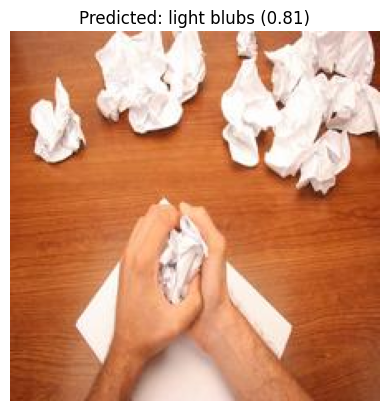

In [ ]:
img_path = '/content/drive/My Drive/Recycling_waste/sample_data/Paper/brainstorming-frustration-picture-id90647073.jpg'  # Example image
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array_preprocessed = preprocess_input(img_array)
img_array_preprocessed = np.expand_dims(img_array_preprocessed, axis=0)

# Predict
prediction = model.predict(img_array_preprocessed)
predicted_class = np.argmax(prediction)
class_labels = list(test_generator.class_indices.keys())
confidence = np.max(prediction)

# Display image and prediction
plt.imshow(np.array(img).astype('uint8'))  # Convert PIL to NumPy array first
plt.axis('off')
plt.title(f"Predicted: {class_labels[predicted_class]} ({confidence:.2f})")

##  EfficientNet

In [ ]:

# 2. Paths to your data
train_dir = '/content/drive/My Drive/Recycling_waste/recycling_train_2'
val_dir   = '/content/drive/My Drive/Recycling_waste/recycling_val_2'

# 3. Data generators
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    horizontal_flip=True,
    vertical_flip=True
)

val_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=True
)

val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

# 4. Confirm preprocessing (optional check)
x_batch, y_batch = next(train_generator)
print("✅ Min pixel value:", x_batch.min())
print("✅ Max pixel value:", x_batch.max())

# 5. Compute class weights
labels = train_generator.classes
class_weights_array = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(labels),
    y=labels
)
class_weights = {i: float(w) for i, w in enumerate(class_weights_array)}
print("Class weights:", class_weights)

# 6. Build EfficientNetB0 model
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
x = base_model.output
x = GlobalAveragePooling2D()(x)
predictions = Dense(9, activation='softmax')(x)  # update if your class count changes

model = Model(inputs=base_model.input, outputs=predictions)

# Freeze base layers for initial training
for layer in base_model.layers:
    layer.trainable = False

# 7. Compile the model
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# 8. Early stopping
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=3,
    restore_best_weights=True,
    verbose=1
)

# 9. Train
history = model.fit(
    train_generator,
    epochs=50,
    validation_data=val_generator,
    class_weight=class_weights,
    callbacks=[early_stop]
)

# 10. Save the model
model.save('/content/drive/My Drive/Recycling_waste/recycle_efficientnet_model.h5')
print("✅ Training complete and EfficientNet model saved!")


Found 2878 images belonging to 9 classes.
Found 360 images belonging to 9 classes.
✅ Min pixel value: 0.0
✅ Max pixel value: 255.0
Class weights: {0: 0.9993055555555556, 1: 0.9993055555555556, 2: 0.9993055555555556, 3: 1.002438174851968, 4: 1.002438174851968, 5: 0.9993055555555556, 6: 0.9993055555555556, 7: 0.9993055555555556, 8: 0.9993055555555556}
16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 696s 8s/step - accuracy: 0.3672 - loss: 1.7963 - val_accuracy: 0.7389 - val_loss: 0.9251
Epoch 2/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 264s 3s/step - accuracy: 0.7411 - loss: 0.8532 - val_accuracy: 0.7611 - val_loss: 0.7525
Epoch 3/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 260s 3s/step - accuracy: 0.8060 - loss: 0.6419 - val_accuracy: 0.7667 - val_loss: 0.6826
Epoch 4/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 260s 3s/step - accuracy: 0.8124 - loss: 0.6010 - val_accuracy: 0.7806 - val_loss: 0.6500
Epoch 5/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 268s 3s/step - accuracy: 0.8458 - loss: 0.5309 - val_accuracy: 0.8056 - val_loss: 0.6179
Epoch 6/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 261s 3s/step - accuracy: 0.8648 - loss: 0.4694 - val_accuracy: 0.8167 - val_loss: 0.6047
Epoch 7/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 269s 3s/step - accuracy: 0.8791 - loss: 0.4218 - val_accuracy: 0.8139 - val_loss: 0.5915
Epoch 8/50
90/90 ━━━━━━━━━━━━━━━━━━━━ 317s 3s/step - accuracy: 0.8871 - loss: 0.4105 - val_accuracy: 0.8083 - v

✅ Training complete and EfficientNet model saved!


## Model Inspection

In [99]:
model = load_model('/content/drive/My Drive/Recycling_waste/recycle_efficientnet_model.h5')

# Evaluate on the validation set

loss, accuracy = model.evaluate(val_generator)
print(f"Test Accuracy: {accuracy:.4f}")


36/36 ━━━━━━━━━━━━━━━━━━━━ 13s 171ms/step - accuracy: 0.8887 - loss: 0.3407
Test Accuracy: 0.8629


In [103]:
val_dir = '/content/drive/My Drive/Recycling_waste/recycling_val_2'

# Recreate the validation generator
val_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

# Now evaluate
loss, accuracy = model.evaluate(val_generator)
print(f"Test Accuracy: {accuracy:.4f}")

Found 360 images belonging to 9 classes.
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.8234 - loss: 0.5260
Test Accuracy: 0.8028


In [104]:

test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

test_generator = test_datagen.flow_from_directory(
    '/content/drive/My Drive/Recycling_waste/recycling_test_2',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

# 3. Evaluate the model
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"✅ Test Accuracy: {test_accuracy:.4f}")
print(f"❌ Test Loss: {test_loss:.4f}")


Found 360 images belonging to 9 classes.
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - accuracy: 0.8664 - loss: 0.4467
✅ Test Accuracy: 0.8333
❌ Test Loss: 0.5313


12/12 ━━━━━━━━━━━━━━━━━━━━ 11s 543ms/step


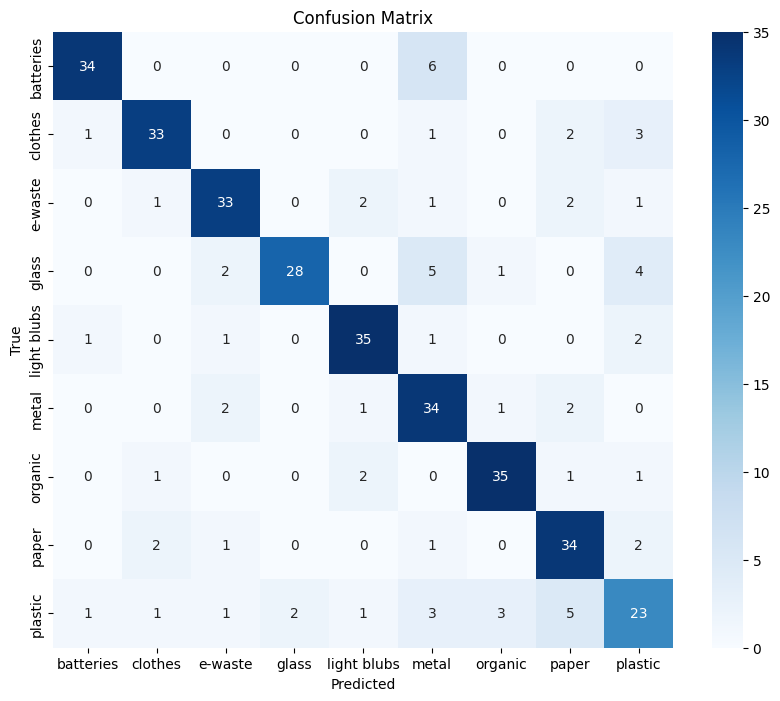

Classification Report:

              precision    recall  f1-score   support

   batteries       0.92      0.85      0.88        40
     clothes       0.87      0.82      0.85        40
     e-waste       0.82      0.82      0.82        40
       glass       0.93      0.70      0.80        40
 light blubs       0.85      0.88      0.86        40
       metal       0.65      0.85      0.74        40
     organic       0.88      0.88      0.88        40
       paper       0.74      0.85      0.79        40
     plastic       0.64      0.57      0.61        40

    accuracy                           0.80       360
   macro avg       0.81      0.80      0.80       360
weighted avg       0.81      0.80      0.80       360



In [105]:
# 1. Predict on validation set
val_generator.reset()  # Reset before predicting
pred_probs = model.predict(val_generator, verbose=1)
y_pred = np.argmax(pred_probs, axis=1)
y_true = val_generator.classes

# 2. Get class labels
class_labels = list(val_generator.class_indices.keys())

# 3. Confusion Matrix
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

# 4. Classification Report
print("Classification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_labels))


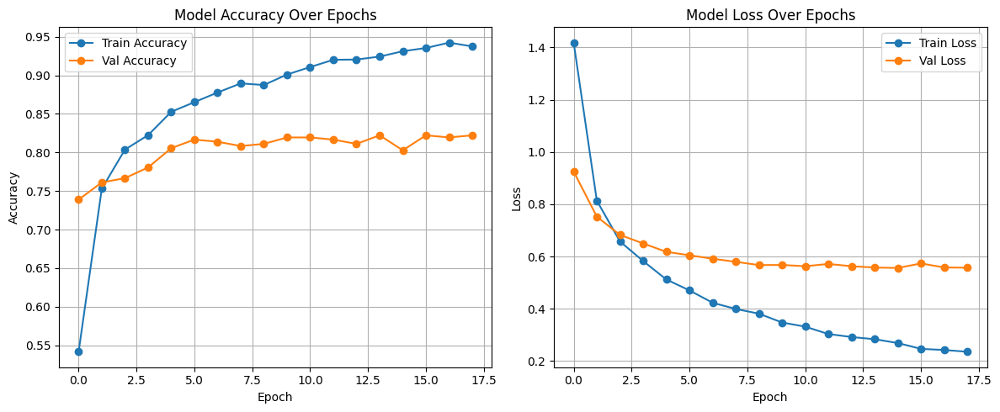

In [ ]:


# Plot accuracy
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy', marker='o')
plt.plot(history.history['val_accuracy'], label='Val Accuracy', marker='o')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss', marker='o')
plt.plot(history.history['val_loss'], label='Val Loss', marker='o')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


### Predicting few Images

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


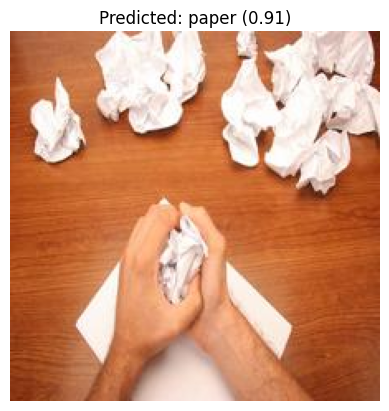

In [ ]:

# Load and preprocess image
img_path = '/content/drive/My Drive/Recycling_waste/sample_data/Paper/brainstorming-frustration-picture-id90647073.jpg'
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array_preprocessed = preprocess_input(img_array)
img_array_preprocessed = np.expand_dims(img_array_preprocessed, axis=0)

# Predict
prediction = model.predict(img_array_preprocessed)
predicted_class = np.argmax(prediction)
confidence = np.max(prediction)

# Get class label
class_labels = list(test_generator.class_indices.keys())
predicted_label = class_labels[predicted_class]

# Display result
plt.imshow(img)
plt.axis('off')
plt.title(f"Predicted: {predicted_label} ({confidence:.2f})")
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


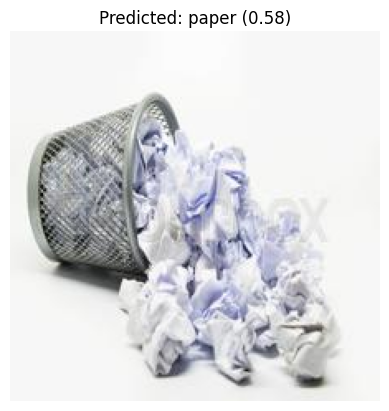

In [ ]:
img_path = '/content/drive/My Drive/Recycling_waste/sample_data/Paper/800px_COLOURBOX24793408.jpg'
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array_preprocessed = preprocess_input(img_array)
img_array_preprocessed = np.expand_dims(img_array_preprocessed, axis=0)

# Predict
prediction = model.predict(img_array_preprocessed)
predicted_class = np.argmax(prediction)
confidence = np.max(prediction)

# Get class label
class_labels = list(test_generator.class_indices.keys())
predicted_label = class_labels[predicted_class]

# Display result
plt.imshow(img)
plt.axis('off')
plt.title(f"Predicted: {predicted_label} ({confidence:.2f})")
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


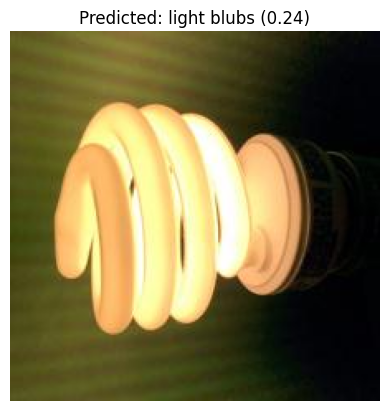

In [ ]:


img_path = '/content/drive/My Drive/Recycling_waste/sample_data/Bulb/10537723_web1_M-Light-Bulb-EDH-180212.jpg'
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array_preprocessed = preprocess_input(img_array)
img_array_preprocessed = np.expand_dims(img_array_preprocessed, axis=0)

# Predict
prediction = model.predict(img_array_preprocessed)
predicted_class = np.argmax(prediction)
confidence = np.max(prediction)

# Get class label
class_labels = list(test_generator.class_indices.keys())
predicted_label = class_labels[predicted_class]

# Display result
plt.imshow(img)
plt.axis('off')
plt.title(f"Predicted: {predicted_label} ({confidence:.2f})")
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


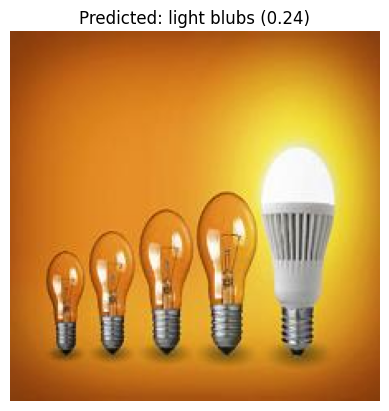

In [ ]:

img_path = '/content/drive/My Drive/Recycling_waste/sample_data/Bulb/0902ledlighting.jpg'
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array_preprocessed = preprocess_input(img_array)
img_array_preprocessed = np.expand_dims(img_array_preprocessed, axis=0)

# Predict
prediction = model.predict(img_array_preprocessed)
predicted_class = np.argmax(prediction)
confidence = np.max(prediction)

# Get class label
class_labels = list(test_generator.class_indices.keys())
predicted_label = class_labels[predicted_class]

# Display result
plt.imshow(img)
plt.axis('off')
plt.title(f"Predicted: {predicted_label} ({confidence:.2f})")
plt.show()

### Class Distribution in Subset Folder

In [ ]:
subset_dir = '/content/drive/My Drive/Recycling_waste/recycling_subset_3'
class_counts = {cls: len(os.listdir(os.path.join(subset_dir, cls)))
                for cls in os.listdir(subset_dir)
                if os.path.isdir(os.path.join(subset_dir, cls))}

print("📊 Class distribution in subset:")
for cls, count in class_counts.items():
    print(f"{cls}: {count}")


📊 Class distribution in subset:
paper: 1313
clothes: 1313
batteries: 1122
glass: 1313
plastic: 1241
organic: 1313
light blubs: 1302
e-waste: 1248
metal: 1092


In [ ]:

train_dir = '/content/drive/My Drive/Recycling_waste/recycling_train_3'
val_dir   = '/content/drive/My Drive/Recycling_waste/recycling_val_3'

# 3. Data generators
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    horizontal_flip=True,
    vertical_flip=True
)

val_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=True
)

val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

# 4. Confirm preprocessing (optional check)
x_batch, y_batch = next(train_generator)
print("✅ Min pixel value:", x_batch.min())
print("✅ Max pixel value:", x_batch.max())

# 5. Compute class weights
labels = train_generator.classes
class_weights_array = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(labels),
    y=labels
)
class_weights = {i: float(w) for i, w in enumerate(class_weights_array)}
print("Class weights:", class_weights)

# 6. Build EfficientNetB0 model
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
x = base_model.output
x = GlobalAveragePooling2D()(x)
predictions = Dense(9, activation='softmax')(x)  # update if your class count changes

model = Model(inputs=base_model.input, outputs=predictions)

# Freeze base layers for initial training
for layer in base_model.layers:
    layer.trainable = False

# 7. Compile the model
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# 8. Early stopping
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=3,
    restore_best_weights=True,
    verbose=1
)

# 9. Train
history = model.fit(
    train_generator,
    epochs=50,
    validation_data=val_generator,
    class_weight=class_weights,
    callbacks=[early_stop]
)

# 10. Save the model
model.save('/content/drive/My Drive/Recycling_waste/recycle_efficientnet_model_2.h5')
print("✅ Training complete and EfficientNet model saved!")


Found 9000 images belonging to 9 classes.
Found 1123 images belonging to 9 classes.
✅ Min pixel value: 0.0
✅ Max pixel value: 255.0
Class weights: {0: 1.1148272017837235, 1: 0.9523809523809523, 2: 1.002004008016032, 3: 0.9523809523809523, 4: 0.9615384615384616, 5: 1.145475372279496, 6: 0.9523809523809523, 7: 0.9523809523809523, 8: 1.0080645161290323}
16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/50
282/282 ━━━━━━━━━━━━━━━━━━━━ 6295s 22s/step - accuracy: 0.5647 - loss: 1.3393 - val_accuracy: 0.8068 - val_loss: 0.6500
Epoch 2/50
282/282 ━━━━━━━━━━━━━━━━━━━━ 40s 142ms/step - accuracy: 0.8080 - loss: 0.6174 - val_accuracy: 0.8370 - val_loss: 0.5542
Epoch 3/50
282/282 ━━━━━━━━━━━━━━━━━━━━ 39s 140ms/step - accuracy: 0.8420 - loss: 0.5137 - val_accuracy: 0.8459 - val_loss: 0.5041
Epoch 4/50
282/282 ━━━━━━━━━━━━━━━━━━━━ 40s 142ms/step - accuracy: 0.8612 - loss: 0.4583 - val_accuracy: 0.8513 - val_loss: 0.4794
Epoch 5/50
282/282 ━━━━━━━━━━━━━━━━━━━━ 40s 141ms/step - accuracy: 0.8763 - loss: 0.4179 - val_accuracy: 0.8611 - val_loss: 0.4596
Epoch 6/50
282/282 ━━━━━━━━━━━━━━━━━━━━ 40s 142ms/step - accuracy: 0.8854 - loss: 0.3823 - val_accuracy: 0.8664 - val_loss: 0.4532
Epoch 7/50
282/282 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - accuracy: 0.8955 - loss: 0.3520 - val_accuracy: 0.8718 - val_loss: 0.4327
Epoch 8/50
282/282 ━━━━━━━━━━━━━━━━━━━━ 40s 141ms/step - accuracy: 0.8944 - loss: 0

✅ Training complete and EfficientNet model saved!


### Model Inspection

In [98]:
model = load_model('/content/drive/My Drive/Recycling_waste/recycle_efficientnet_model_2.h5')

# Evaluate on the validation set

loss, accuracy = model.evaluate(val_generator)
print(f"Test Accuracy: {accuracy:.4f}")

36/36 ━━━━━━━━━━━━━━━━━━━━ 13s 170ms/step - accuracy: 0.8984 - loss: 0.3071
Test Accuracy: 0.8780


In [93]:
val_dir = '/content/drive/My Drive/Recycling_waste/recycling_val_3'

# ✅ Use EfficientNet-specific preprocessing
val_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

# ✅ Load your fine-tuned model
model = load_model('/content/drive/My Drive/Recycling_waste/recycle_efficientnet_model_2.h5')

# ✅ Evaluate the model on validation data
loss, accuracy = model.evaluate(val_generator)
print(f"Validation Accuracy: {accuracy:.4f}")
print(f"Validation Loss: {loss:.4f}")


Found 1123 images belonging to 9 classes.


36/36 ━━━━━━━━━━━━━━━━━━━━ 13s 170ms/step - accuracy: 0.8984 - loss: 0.3071
Validation Accuracy: 0.8780
Validation Loss: 0.4032


36/36 ━━━━━━━━━━━━━━━━━━━━ 13s 223ms/step


<ipython-input-95-3f8553f1eb28>:14: UserWarning:

Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans.



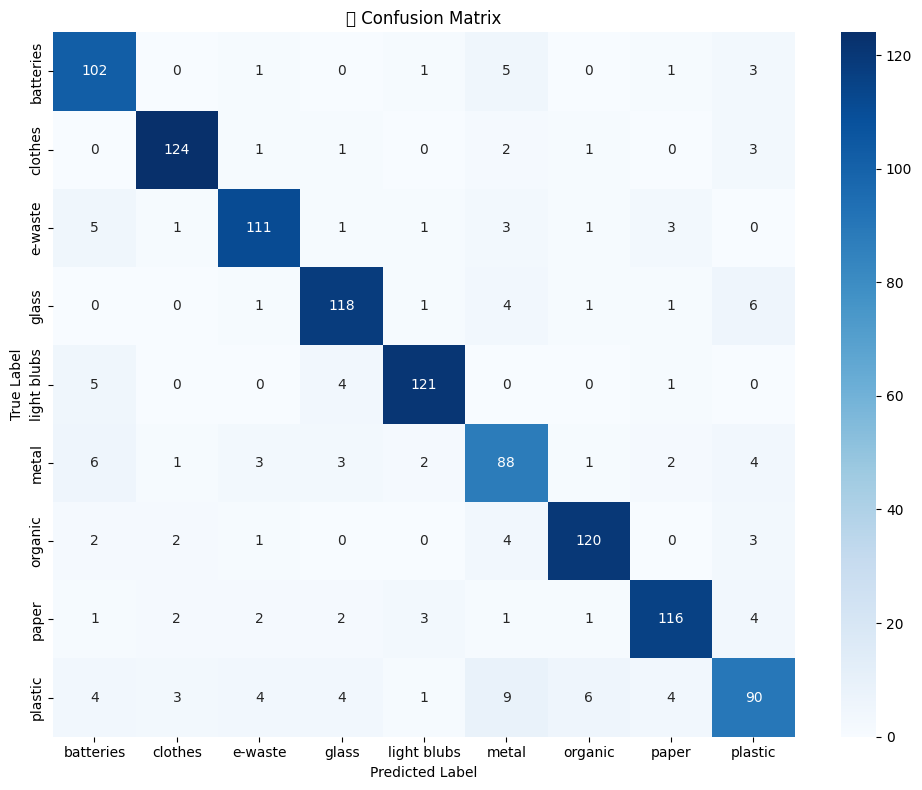


📊 Classification Report:
              precision    recall  f1-score   support

   batteries       0.82      0.90      0.86       113
     clothes       0.93      0.94      0.94       132
     e-waste       0.90      0.88      0.89       126
       glass       0.89      0.89      0.89       132
 light blubs       0.93      0.92      0.93       131
       metal       0.76      0.80      0.78       110
     organic       0.92      0.91      0.91       132
       paper       0.91      0.88      0.89       132
     plastic       0.80      0.72      0.76       125

    accuracy                           0.87      1133
   macro avg       0.87      0.87      0.87      1133
weighted avg       0.87      0.87      0.87      1133



In [95]:
# ✅ Predict labels
y_pred_probs = model.predict(test_generator)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

# ✅ Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title("🧠 Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.tight_layout()
plt.show()

# ✅ Classification report
print("\n📊 Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_labels))


In [110]:
model = load_model('/content/drive/My Drive/Recycling_waste/recycle_efficientnet_model.h5')

# 2. Prepare test data generator
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

test_generator = test_datagen.flow_from_directory(
    '/content/drive/My Drive/Recycling_waste/recycling_test_3',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

# 3. Evaluate the model
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"✅ Test Accuracy: {test_accuracy:.4f}")
print(f"❌ Test Loss: {test_loss:.4f}")

Found 1133 images belonging to 9 classes.
36/36 ━━━━━━━━━━━━━━━━━━━━ 13s 171ms/step - accuracy: 0.8796 - loss: 0.3718
✅ Test Accuracy: 0.8588
❌ Test Loss: 0.4539


36/36 ━━━━━━━━━━━━━━━━━━━━ 13s 231ms/step


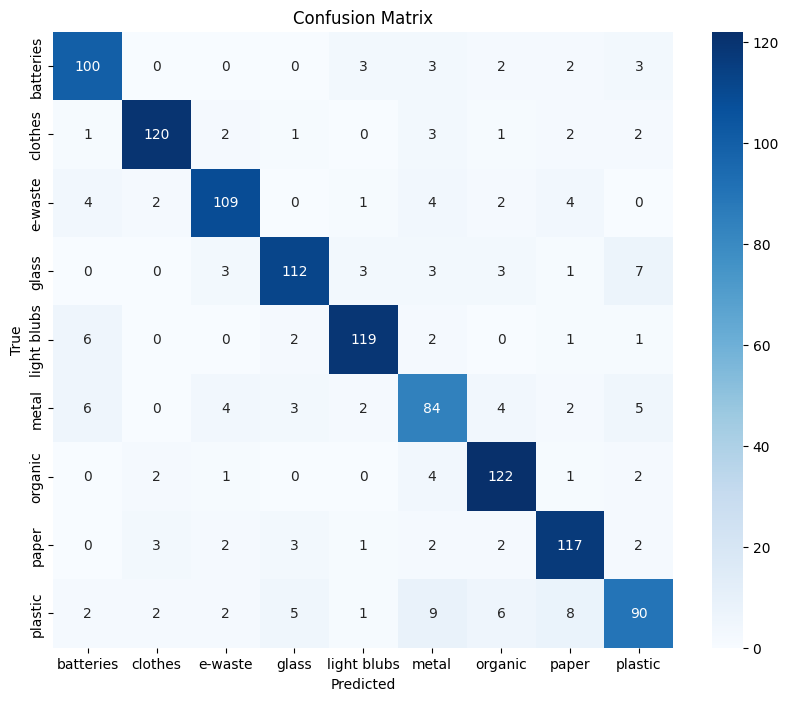

Classification Report:

              precision    recall  f1-score   support

   batteries       0.84      0.88      0.86       113
     clothes       0.93      0.91      0.92       132
     e-waste       0.89      0.87      0.88       126
       glass       0.89      0.85      0.87       132
 light blubs       0.92      0.91      0.91       131
       metal       0.74      0.76      0.75       110
     organic       0.86      0.92      0.89       132
       paper       0.85      0.89      0.87       132
     plastic       0.80      0.72      0.76       125

    accuracy                           0.86      1133
   macro avg       0.86      0.86      0.86      1133
weighted avg       0.86      0.86      0.86      1133



In [111]:
test_generator.reset()
pred_probs = model.predict(test_generator, verbose=1)
y_pred = np.argmax(pred_probs, axis=1)
y_true = test_generator.classes

# ✅ Get class labels
class_labels = list(test_generator.class_indices.keys())

# ✅ Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

# ✅ Classification Report
print("Classification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_labels))


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


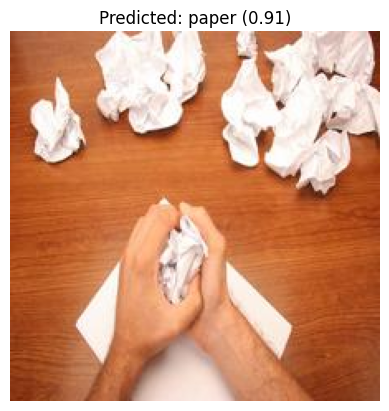

In [112]:

# Load and preprocess image
img_path = '/content/drive/My Drive/Recycling_waste/sample_data/Paper/brainstorming-frustration-picture-id90647073.jpg'
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array_preprocessed = preprocess_input(img_array)
img_array_preprocessed = np.expand_dims(img_array_preprocessed, axis=0)

# Predict
prediction = model.predict(img_array_preprocessed)
predicted_class = np.argmax(prediction)
confidence = np.max(prediction)

# Get class label
class_labels = list(test_generator.class_indices.keys())  # Make sure test_generator was created using same class order
predicted_label = class_labels[predicted_class]

# Display result
plt.imshow(img)
plt.axis('off')
plt.title(f"Predicted: {predicted_label} ({confidence:.2f})")
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


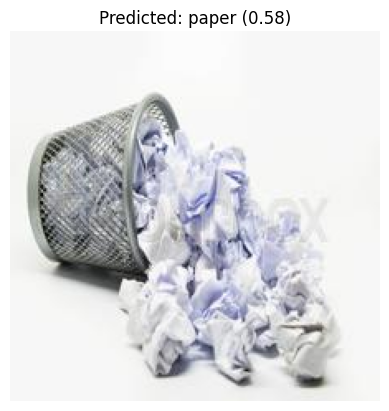

In [113]:
# Load and preprocess image
img_path = '/content/drive/My Drive/Recycling_waste/sample_data/Paper/800px_COLOURBOX24793408.jpg'
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array_preprocessed = preprocess_input(img_array)
img_array_preprocessed = np.expand_dims(img_array_preprocessed, axis=0)

# Predict
prediction = model.predict(img_array_preprocessed)
predicted_class = np.argmax(prediction)
confidence = np.max(prediction)

# Get class label
class_labels = list(test_generator.class_indices.keys())  # Make sure test_generator was created using same class order
predicted_label = class_labels[predicted_class]

# Display result
plt.imshow(img)
plt.axis('off')
plt.title(f"Predicted: {predicted_label} ({confidence:.2f})")
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


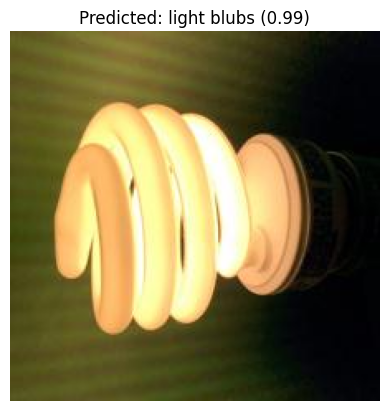

In [ ]:
# Load and preprocess image
img_path = '/content/drive/My Drive/Recycling_waste/sample_data/Bulb/10537723_web1_M-Light-Bulb-EDH-180212.jpg'
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array_preprocessed = preprocess_input(img_array)
img_array_preprocessed = np.expand_dims(img_array_preprocessed, axis=0)

# Predict
prediction = model.predict(img_array_preprocessed)
predicted_class = np.argmax(prediction)
confidence = np.max(prediction)

# Get class label
class_labels = list(test_generator.class_indices.keys())  # Make sure test_generator was created using same class order
predicted_label = class_labels[predicted_class]

# Display result
plt.imshow(img)
plt.axis('off')
plt.title(f"Predicted: {predicted_label} ({confidence:.2f})")
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


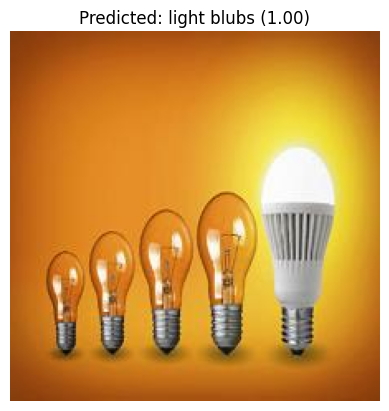

In [ ]:
# Load and preprocess image
img_path = '/content/drive/My Drive/Recycling_waste/sample_data/Bulb/0902ledlighting.jpg'
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array_preprocessed = preprocess_input(img_array)
img_array_preprocessed = np.expand_dims(img_array_preprocessed, axis=0)

# Predict
prediction = model.predict(img_array_preprocessed)
predicted_class = np.argmax(prediction)
confidence = np.max(prediction)

# Get class label
class_labels = list(test_generator.class_indices.keys())  # Make sure test_generator was created using same class order
predicted_label = class_labels[predicted_class]

# Display result
plt.imshow(img)
plt.axis('off')
plt.title(f"Predicted: {predicted_label} ({confidence:.2f})")
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


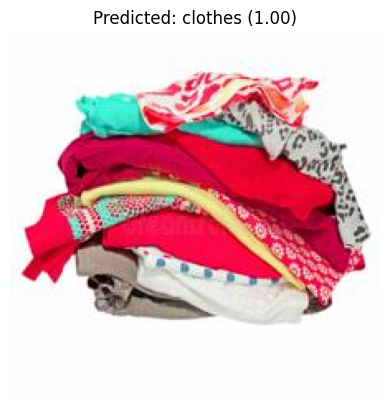

In [ ]:
# Load and preprocess image
img_path = '/content/drive/My Drive/Recycling_waste/sample_data/Clothes/assorted-clothes-isolated-heap-colorful-white-36145930.jpg'
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array_preprocessed = preprocess_input(img_array)
img_array_preprocessed = np.expand_dims(img_array_preprocessed, axis=0)

# Predict
prediction = model.predict(img_array_preprocessed)
predicted_class = np.argmax(prediction)
confidence = np.max(prediction)

# Get class label
class_labels = list(test_generator.class_indices.keys())  # Make sure test_generator was created using same class order
predicted_label = class_labels[predicted_class]

# Display result
plt.imshow(img)
plt.axis('off')
plt.title(f"Predicted: {predicted_label} ({confidence:.2f})")
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


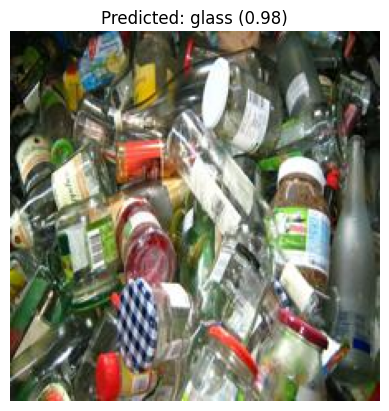

In [ ]:
img_path = '/content/drive/My Drive/Recycling_waste/sample_data/Glass/2451_1_1280-0-0_.jpg'
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array_preprocessed = preprocess_input(img_array)
img_array_preprocessed = np.expand_dims(img_array_preprocessed, axis=0)

# Predict
prediction = model.predict(img_array_preprocessed)
predicted_class = np.argmax(prediction)
confidence = np.max(prediction)

# Get class label
class_labels = list(test_generator.class_indices.keys())  # Make sure test_generator was created using same class order
predicted_label = class_labels[predicted_class]

# Display result
plt.imshow(img)
plt.axis('off')
plt.title(f"Predicted: {predicted_label} ({confidence:.2f})")
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


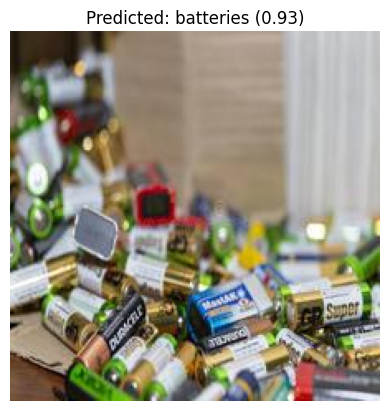

In [ ]:
img_path = '/content/drive/My Drive/Recycling_waste/sample_data/Battery/aa-batteries-energy-household-appliances-battery-recycling-used-alkaline-batteries-aa-size-format-207672475.jpg'
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array_preprocessed = preprocess_input(img_array)
img_array_preprocessed = np.expand_dims(img_array_preprocessed, axis=0)

# Predict
prediction = model.predict(img_array_preprocessed)
predicted_class = np.argmax(prediction)
confidence = np.max(prediction)

# Get class label
class_labels = list(test_generator.class_indices.keys())  # Make sure test_generator was created using same class order
predicted_label = class_labels[predicted_class]

# Display result
plt.imshow(img)
plt.axis('off')
plt.title(f"Predicted: {predicted_label} ({confidence:.2f})")
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


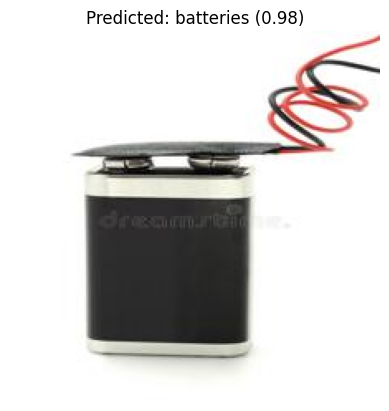

In [ ]:
img_path = '/content/drive/My Drive/Recycling_waste/sample_data/Battery/9v-battery-13693137.jpg'
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array_preprocessed = preprocess_input(img_array)
img_array_preprocessed = np.expand_dims(img_array_preprocessed, axis=0)

# Predict
prediction = model.predict(img_array_preprocessed)
predicted_class = np.argmax(prediction)
confidence = np.max(prediction)

# Get class label
class_labels = list(test_generator.class_indices.keys())  # Make sure test_generator was created using same class order
predicted_label = class_labels[predicted_class]

# Display result
plt.imshow(img)
plt.axis('off')
plt.title(f"Predicted: {predicted_label} ({confidence:.2f})")
plt.show()

In [ ]:

# ✅ Define preprocessing (you likely used this for EfficientNet)
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

val_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

# ✅ Paths to your data
train_dir = '/content/drive/My Drive/Recycling_waste/recycling_train_3'
val_dir   = '/content/drive/My Drive/Recycling_waste/recycling_val_3'


# ✅ Set up generators
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)


Found 9000 images belonging to 9 classes.
Found 1123 images belonging to 9 classes.


In [ ]:


model = load_model('/content/drive/My Drive/Recycling_waste/recycle_efficientnet_model_2.h5')

# ✅ Unfreeze the base model for fine-tuning
for layer in model.layers:
    layer.trainable = True  # You can also selectively unfreeze later layers only

# ✅ Recompile with a lower learning rate
model.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# ✅ Callbacks (updated with Keras format)
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

checkpoint = ModelCheckpoint(
    '/content/drive/My Drive/Recycling_waste/recycle_efficientnet_finetuned.keras',
    monitor='val_accuracy',
    save_best_only=True,
    verbose=1
)

# ✅ Fine-tune the model
history_finetune = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=20,
    callbacks=[early_stop, checkpoint]
)


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20
282/282 ━━━━━━━━━━━━━━━━━━━━ 0s 9s/step - accuracy: 0.6450 - loss: 1.0786
Epoch 1: val_accuracy improved from -inf to 0.77649, saving model to /content/drive/My Drive/Recycling_waste/recycle_efficientnet_finetuned.keras
282/282 ━━━━━━━━━━━━━━━━━━━━ 2820s 10s/step - accuracy: 0.6451 - loss: 1.0783 - val_accuracy: 0.7765 - val_loss: 0.6808
Epoch 2/20
282/282 ━━━━━━━━━━━━━━━━━━━━ 0s 512ms/step - accuracy: 0.7474 - loss: 0.7575
Epoch 2: val_accuracy improved from 0.77649 to 0.79430, saving model to /content/drive/My Drive/Recycling_waste/recycle_efficientnet_finetuned.keras
282/282 ━━━━━━━━━━━━━━━━━━━━ 150s 530ms/step - accuracy: 0.7474 - loss: 0.7574 - val_accuracy: 0.7943 - val_loss: 0.6404
Epoch 3/20
282/282 ━━━━━━━━━━━━━━━━━━━━ 0s 508ms/step - accuracy: 0.7689 - loss: 0.6664
Epoch 3: val_accuracy improved from 0.79430 to 0.81745, saving model to /content/drive/My Drive/Recycling_waste/recycle_efficientnet_finetuned.keras
282/282 ━━━━━━━━━━━━━━━━━━━━ 148s 526ms/step - accurac

In [ ]:


# 2. Data generators (same paths)
train_dir = '/content/drive/My Drive/Recycling_waste/recycling_train_3'
val_dir = '/content/drive/My Drive/Recycling_waste/recycling_val_3'

train_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.efficientnet.preprocess_input,
    horizontal_flip=True,
    vertical_flip=True
)

val_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.efficientnet.preprocess_input
)

train_generator = train_datagen.flow_from_directory(
    train_dir, target_size=(224, 224), batch_size=32, class_mode='categorical', shuffle=True
)

val_generator = val_datagen.flow_from_directory(
    val_dir, target_size=(224, 224), batch_size=32, class_mode='categorical', shuffle=False
)

# 3. Load the previously fine-tuned model
model = load_model('/content/drive/My Drive/Recycling_waste/recycle_efficientnet_finetuned.keras')

# 4. Resume training
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)
checkpoint = ModelCheckpoint(
    '/content/drive/My Drive/Recycling_waste/recycle_efficientnet_finetuned.keras',
    monitor='val_accuracy',
    save_best_only=True,
    verbose=1
)

history_finetune = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=20,  # resume training
    callbacks=[early_stop, checkpoint]
)


Found 9000 images belonging to 9 classes.
Found 1123 images belonging to 9 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20
282/282 ━━━━━━━━━━━━━━━━━━━━ 0s 19s/step - accuracy: 0.8860 - loss: 0.3457 
Epoch 1: val_accuracy improved from -inf to 0.89403, saving model to /content/drive/My Drive/Recycling_waste/recycle_efficientnet_finetuned.keras
282/282 ━━━━━━━━━━━━━━━━━━━━ 6165s 22s/step - accuracy: 0.8860 - loss: 0.3457 - val_accuracy: 0.8940 - val_loss: 0.3776
Epoch 2/20
282/282 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - accuracy: 0.8990 - loss: 0.3140
Epoch 2: val_accuracy improved from 0.89403 to 0.89849, saving model to /content/drive/My Drive/Recycling_waste/recycle_efficientnet_finetuned.keras
282/282 ━━━━━━━━━━━━━━━━━━━━ 31s 110ms/step - accuracy: 0.8990 - loss: 0.3140 - val_accuracy: 0.8985 - val_loss: 0.3641
Epoch 3/20
282/282 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - accuracy: 0.9043 - loss: 0.3006
Epoch 3: val_accuracy did not improve from 0.89849
282/282 ━━━━━━━━━━━━━━━━━━━━ 31s 108ms/step - accuracy: 0.9043 - loss: 0.3005 - val_accuracy: 0.8985 - val_loss: 0.3565
Epoch 4/20
282/282 ━━━━━━━━━━━━━━

In [121]:

#  Load the previously fine-tuned model
model = load_model('/content/drive/My Drive/Recycling_waste/recycle_efficientnet_finetuned.keras')
# Evaluate on the validation set

loss, accuracy = model.evaluate(val_generator)
print(f"Test Accuracy: {accuracy:.4f}")

12/12 ━━━━━━━━━━━━━━━━━━━━ 10s 303ms/step - accuracy: 0.9857 - loss: 0.0489
Test Accuracy: 0.9778


In [125]:
# 1. Create val_generator
val_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

val_generator = val_datagen.flow_from_directory(
    '/content/drive/My Drive/Recycling_waste/recycling_val_3',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

# 2. Load the fine-tuned model
model = load_model('/content/drive/My Drive/Recycling_waste/recycle_efficientnet_finetuned.keras')

# 3. Evaluate on validation data
loss, accuracy = model.evaluate(val_generator)
print(f"✅ Validation Accuracy: {accuracy:.4f}")
print(f"❌ Validation Loss: {loss:.4f}")


Found 1123 images belonging to 9 classes.
36/36 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - accuracy: 0.9439 - loss: 0.1940
✅ Validation Accuracy: 0.9243
❌ Validation Loss: 0.2764


36/36 ━━━━━━━━━━━━━━━━━━━━ 12s 223ms/step
              precision    recall  f1-score   support

   batteries       0.91      0.94      0.93       112
     clothes       0.97      0.97      0.97       131
     e-waste       0.93      0.95      0.94       124
       glass       0.95      0.94      0.94       131
 light blubs       0.96      0.95      0.96       130
       metal       0.87      0.83      0.85       109
     organic       0.93      0.94      0.94       131
       paper       0.91      0.92      0.92       131
     plastic       0.87      0.86      0.87       124

    accuracy                           0.92      1123
   macro avg       0.92      0.92      0.92      1123
weighted avg       0.92      0.92      0.92      1123



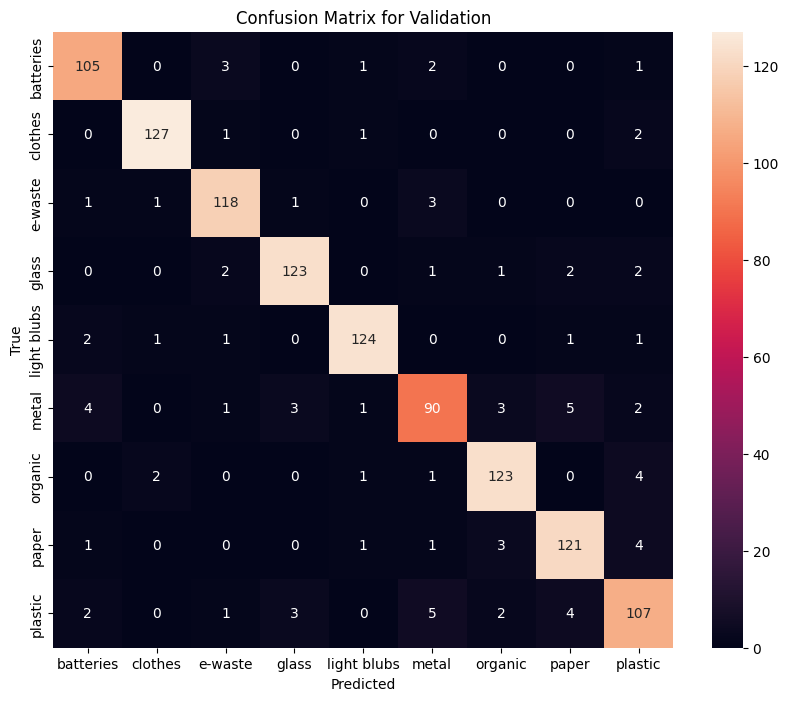

In [126]:
y_pred = model.predict(val_generator)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = val_generator.classes
print(classification_report(y_true, y_pred_classes, target_names=val_generator.class_indices.keys()))


plt.figure(figsize=(10, 8))
cm = confusion_matrix(y_true, y_pred_classes)
sns.heatmap(cm, annot=True, fmt='d', xticklabels=val_generator.class_indices, yticklabels=val_generator.class_indices)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix for Validation")
plt.show()

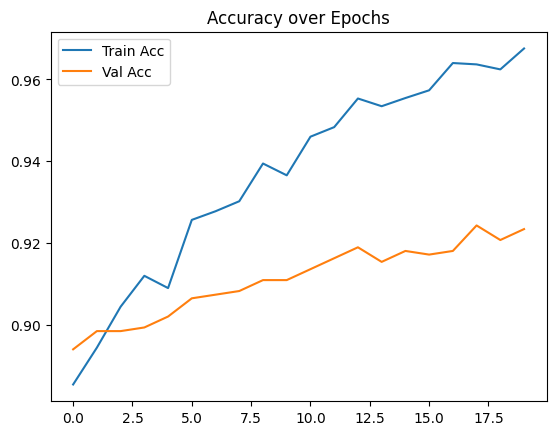

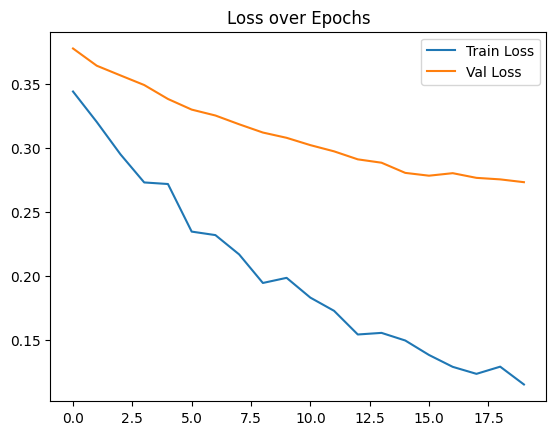

In [ ]:
plt.plot(history_finetune.history['accuracy'], label='Train Acc')
plt.plot(history_finetune.history['val_accuracy'], label='Val Acc')
plt.title('Accuracy over Epochs')
plt.legend()
plt.show()

plt.plot(history_finetune.history['loss'], label='Train Loss')
plt.plot(history_finetune.history['val_loss'], label='Val Loss')
plt.title('Loss over Epochs')
plt.legend()
plt.show()


TEST

In [ ]:
# ✅ Path to your test data
test_dir = '/content/drive/My Drive/Recycling_waste/recycling_test_3'

# ✅ Set up the test data generator
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False  # Keep for consistent predictions
)


Found 1133 images belonging to 9 classes.


In [ ]:
test_loss, test_acc = model.evaluate(test_generator)
print(f"Test Accuracy: {test_acc:.4f}")
print(f"Test Loss: {test_loss:.4f}")


36/36 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - accuracy: 0.9448 - loss: 0.1784
Test Accuracy: 0.9276
Test Loss: 0.2443


36/36 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step


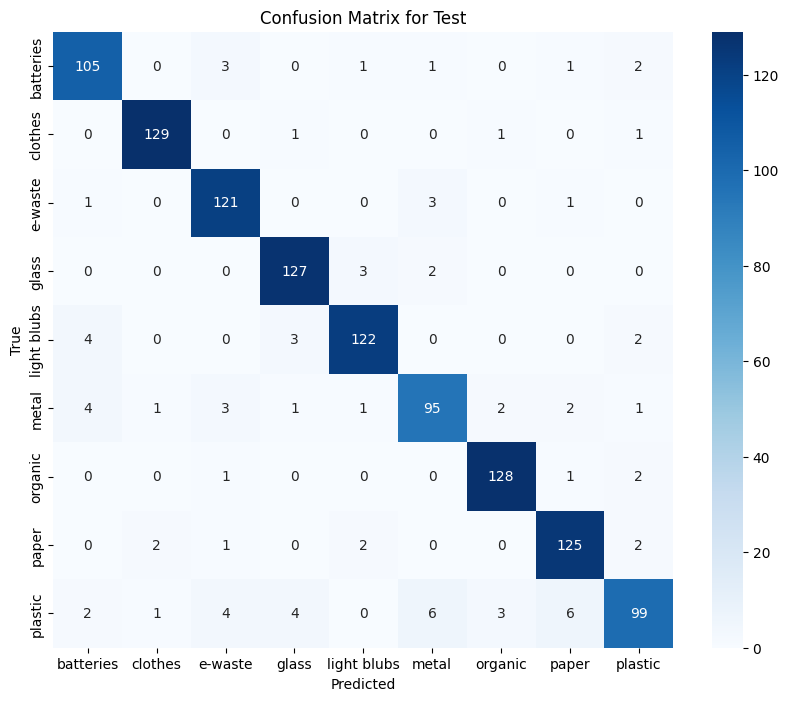

Classification Report:
              precision    recall  f1-score   support

   batteries       0.91      0.93      0.92       113
     clothes       0.97      0.98      0.97       132
     e-waste       0.91      0.96      0.93       126
       glass       0.93      0.96      0.95       132
 light blubs       0.95      0.93      0.94       131
       metal       0.89      0.86      0.88       110
     organic       0.96      0.97      0.96       132
       paper       0.92      0.95      0.93       132
     plastic       0.91      0.79      0.85       125

    accuracy                           0.93      1133
   macro avg       0.93      0.93      0.93      1133
weighted avg       0.93      0.93      0.93      1133



In [ ]:

# Predict
y_probs = model.predict(test_generator)
y_pred = np.argmax(y_probs, axis=1)
y_true = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_labels, yticklabels=class_labels, cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix for Test')
plt.show()

# Classification Report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_labels))


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


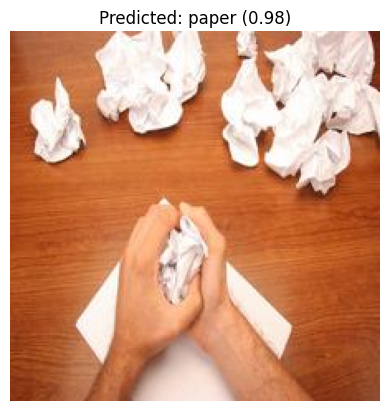

In [ ]:
# Load and preprocess image
img_path = '/content/drive/My Drive/Recycling_waste/sample_data/Paper/brainstorming-frustration-picture-id90647073.jpg'
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array_preprocessed = preprocess_input(img_array)
img_array_preprocessed = np.expand_dims(img_array_preprocessed, axis=0)

# Predict
prediction = model.predict(img_array_preprocessed)
predicted_class = np.argmax(prediction)
confidence = np.max(prediction)

# Get class label
class_labels = list(test_generator.class_indices.keys())
predicted_label = class_labels[predicted_class]

# Display result
plt.imshow(img)
plt.axis('off')
plt.title(f"Predicted: {predicted_label} ({confidence:.2f})")
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Text(0.5, 1.0, 'Predicted: paper (1.00)')

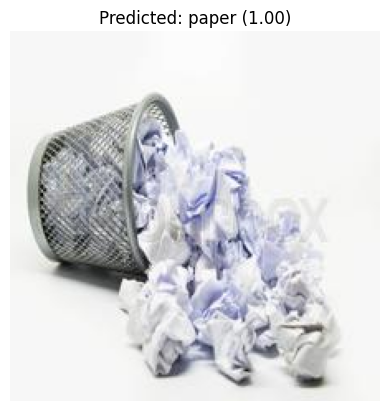

In [ ]:

# Load and preprocess image
img_path = '/content/drive/My Drive/Recycling_waste/sample_data/Paper/800px_COLOURBOX24793408.jpg'
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array_preprocessed = preprocess_input(img_array)
img_array_preprocessed = np.expand_dims(img_array_preprocessed, axis=0)

# Predict
prediction = model.predict(img_array_preprocessed)
predicted_class = np.argmax(prediction)
confidence = np.max(prediction)

# Get class label
class_labels = list(test_generator.class_indices.keys())
predicted_label = class_labels[predicted_class]

# Display result
plt.imshow(img)
plt.axis('off')
plt.title(f"Predicted: {predicted_label} ({confidence:.2f})")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


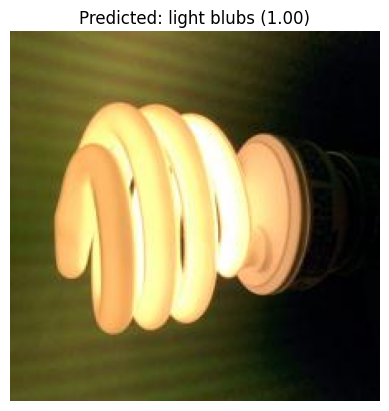

In [ ]:
# Load and preprocess image
img_path = '/content/drive/My Drive/Recycling_waste/sample_data/Bulb/10537723_web1_M-Light-Bulb-EDH-180212.jpg'
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array_preprocessed = preprocess_input(img_array)
img_array_preprocessed = np.expand_dims(img_array_preprocessed, axis=0)

# Predict
prediction = model.predict(img_array_preprocessed)
predicted_class = np.argmax(prediction)
confidence = np.max(prediction)

# Get class label
class_labels = list(test_generator.class_indices.keys())
predicted_label = class_labels[predicted_class]

# Display result
plt.imshow(img)
plt.axis('off')
plt.title(f"Predicted: {predicted_label} ({confidence:.2f})")
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


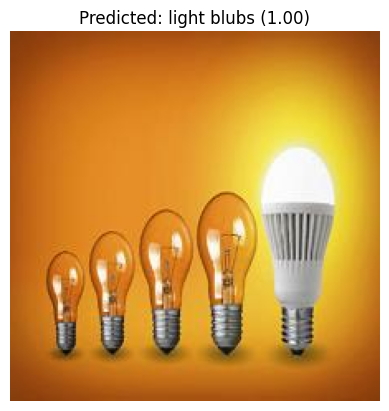

In [ ]:
# Load and preprocess image
img_path = '/content/drive/My Drive/Recycling_waste/sample_data/Bulb/0902ledlighting.jpg'
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array_preprocessed = preprocess_input(img_array)
img_array_preprocessed = np.expand_dims(img_array_preprocessed, axis=0)

# Predict
prediction = model.predict(img_array_preprocessed)
predicted_class = np.argmax(prediction)
confidence = np.max(prediction)

# Get class label
class_labels = list(test_generator.class_indices.keys())
predicted_label = class_labels[predicted_class]

# Display result
plt.imshow(img)
plt.axis('off')
plt.title(f"Predicted: {predicted_label} ({confidence:.2f})")
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


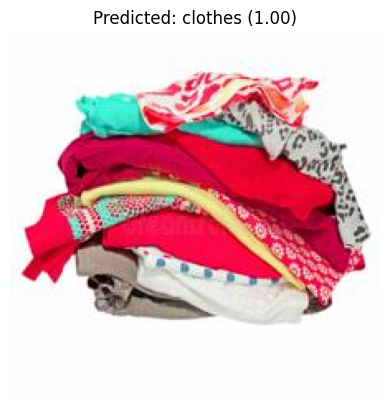

In [ ]:
# Load and preprocess image
img_path = '/content/drive/My Drive/Recycling_waste/sample_data/Clothes/assorted-clothes-isolated-heap-colorful-white-36145930.jpg'
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array_preprocessed = preprocess_input(img_array)
img_array_preprocessed = np.expand_dims(img_array_preprocessed, axis=0)

# Predict
prediction = model.predict(img_array_preprocessed)
predicted_class = np.argmax(prediction)
confidence = np.max(prediction)

# Get class label
class_labels = list(test_generator.class_indices.keys())
predicted_label = class_labels[predicted_class]

# Display result
plt.imshow(img)
plt.axis('off')
plt.title(f"Predicted: {predicted_label} ({confidence:.2f})")
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


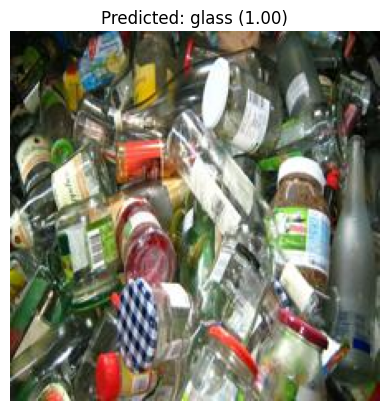

In [ ]:
img_path = '/content/drive/My Drive/Recycling_waste/sample_data/Glass/2451_1_1280-0-0_.jpg'
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array_preprocessed = preprocess_input(img_array)
img_array_preprocessed = np.expand_dims(img_array_preprocessed, axis=0)

# Predict
prediction = model.predict(img_array_preprocessed)
predicted_class = np.argmax(prediction)
confidence = np.max(prediction)

# Get class label
class_labels = list(test_generator.class_indices.keys())
predicted_label = class_labels[predicted_class]

# Display result
plt.imshow(img)
plt.axis('off')
plt.title(f"Predicted: {predicted_label} ({confidence:.2f})")
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


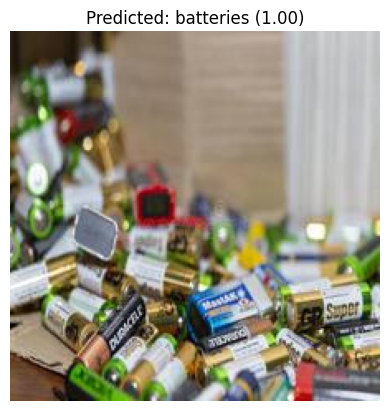

In [ ]:
img_path = '/content/drive/My Drive/Recycling_waste/sample_data/Battery/aa-batteries-energy-household-appliances-battery-recycling-used-alkaline-batteries-aa-size-format-207672475.jpg'
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array_preprocessed = preprocess_input(img_array)
img_array_preprocessed = np.expand_dims(img_array_preprocessed, axis=0)

# Predict
prediction = model.predict(img_array_preprocessed)
predicted_class = np.argmax(prediction)
confidence = np.max(prediction)

# Get class label
class_labels = list(test_generator.class_indices.keys())
predicted_label = class_labels[predicted_class]

# Display result
plt.imshow(img)
plt.axis('off')
plt.title(f"Predicted: {predicted_label} ({confidence:.2f})")
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


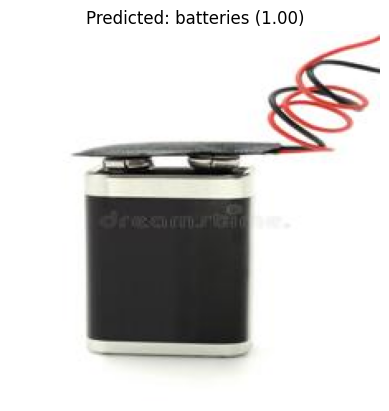

In [ ]:
img_path = '/content/drive/My Drive/Recycling_waste/sample_data/Battery/9v-battery-13693137.jpg'
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array_preprocessed = preprocess_input(img_array)
img_array_preprocessed = np.expand_dims(img_array_preprocessed, axis=0)

# Predict
prediction = model.predict(img_array_preprocessed)
predicted_class = np.argmax(prediction)
confidence = np.max(prediction)

# Get class label
class_labels = list(test_generator.class_indices.keys())
predicted_label = class_labels[predicted_class]

# Display result
plt.imshow(img)
plt.axis('off')
plt.title(f"Predicted: {predicted_label} ({confidence:.2f})")
plt.show()